In [192]:
import sys
sys.path.append("../")

In [193]:
import pandas as pd
import plotly.graph_objects as go
from plotting import CandlePlot
import numpy as np

from simulation.pair_trade_percent_binance import PairTradePercent
from technicals.indicators import Donchian_Close

from functools import reduce

In [194]:

from multiprocessing import Process, Manager
import pickle
import warnings
warnings.filterwarnings('ignore')

In [195]:

# def calculate_rsi(df, period=14):
#     # Calcula as diferenças dos preços de fechamento
#     df['Price Change'] = df['Close'].diff()
    
#     # Separa ganhos e perdas
#     df['Gain'] = df['Price Change'].apply(lambda x: x if x > 0 else 0)
#     df['Loss'] = df['Price Change'].apply(lambda x: -x if x < 0 else 0)
    
#     # Calcula as médias móveis exponenciais dos ganhos e perdas
#     avg_gain = df['Gain'].rolling(window=period).mean()
#     avg_loss = df['Loss'].rolling(window=period).mean()
    
#     # Calcula o RSI
#     rs = avg_gain / avg_loss
#     df['RSI'] = 100 - (100 / (1 + rs))
    
#     # Limpa colunas temporárias
#     df.drop(columns=['Price Change', 'Gain', 'Loss'], inplace=True)
    
#     return df




# def calculate_adx(df, period=14):
#     # Cálculo de +DM, -DM e TR
#     df['High-Low'] = df['High'] - df['Low']
#     df['High-Close'] = abs(df['High'] - df['Close'].shift(1))
#     df['Low-Close'] = abs(df['Low'] - df['Close'].shift(1))
    
#     df['TR'] = df[['High-Low', 'High-Close', 'Low-Close']].max(axis=1)
#     df['+DM'] = np.where((df['High'] - df['High'].shift(1)) > (df['Low'].shift(1) - df['Low']), 
#                          np.maximum(df['High'] - df['High'].shift(1), 0), 0)
#     df['-DM'] = np.where((df['Low'].shift(1) - df['Low']) > (df['High'] - df['High'].shift(1)), 
#                          np.maximum(df['Low'].shift(1) - df['Low'], 0), 0)
    
#     # Suavizando os valores de TR, +DM e -DM com média móvel exponencial
#     df['TR_smooth'] = df['TR'].rolling(window=period).sum()
#     df['+DM_smooth'] = df['+DM'].rolling(window=period).sum()
#     df['-DM_smooth'] = df['-DM'].rolling(window=period).sum()
    
#     # Cálculo de +DI e -DI
#     df['+DI'] = 100 * (df['+DM_smooth'] / df['TR_smooth'])
#     df['-DI'] = 100 * (df['-DM_smooth'] / df['TR_smooth'])
    
#     # Cálculo do DX
#     df['DX'] = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    
#     # Cálculo do ADX
#     df['ADX'] = df['DX'].rolling(window=period).mean()

#     # Limpando colunas temporárias
#     df.drop(columns=['High-Low', 'High-Close', 'Low-Close', 'TR', '+DM', '-DM', 'TR_smooth', '+DM_smooth', '-DM_smooth', 'DX'], inplace=True)

#     return df
    
# # Função para calcular a variação percentual acumulada
# def calculate_percent_change(close_prices, window):
#     percent_change = np.zeros(len(close_prices))

#     for i in range(window, len(close_prices)):
#         window_sum = 0.0
#         for j in range(i - window + 1, i + 1):
#             percent_change[j] = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
#             window_sum += percent_change[j]
#         percent_change[i] = window_sum

#     return percent_change


# Função para calcular a variação percentual acumulada com uma janela deslizante correta
def calculate_percent_change(close_prices, window):
    percent_change = np.zeros(len(close_prices))

    for i in range(window, len(close_prices)):
        window_sum = 0.0
        for j in range(i - window + 1, i + 1):
            # Calcula a variação percentual entre o ponto atual e o ponto anterior
            change = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
            window_sum += change
        # Atribui o valor acumulado da janela atual ao ponto final da janela
        percent_change[i] = window_sum

    return percent_change



# Função para calcular a EMA
def calculate_ema(values, period):
    ema = np.zeros(len(values))
    multiplier = 2 / (period + 1)
    ema[period - 1] = values[period - 1]  # O primeiro valor da EMA é igual ao valor inicial
    for i in range(period, len(values)):
        ema[i] = (values[i] - ema[i - 1]) * multiplier + ema[i - 1]
    return ema

# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_indicators(df, window=14, ema_period_1=10, ema_period_2=60):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    ema_1 = calculate_ema(percent_change, ema_period_1)
    ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # Adiciona os resultados ao DataFrame original
    df['Percent_Change'] = percent_change
    df['EMA_percent_s'] = ema_1
    df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return df


# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_emaper(df, window=14):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    # ema_1 = calculate_ema(percent_change, ema_period_1)
    # ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # # Adiciona os resultados ao DataFrame original
    # df['Percent_Change'] = percent_change
    # df['EMA_percent_s'] = ema_1
    # df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return percent_change
    


import pandas as pd
import numpy as np

def calculate_rsi(df, period=14):
    # Calcula as diferenças dos preços de fechamento
    delta = df['Close'].diff()
    
    # Separa ganhos e perdas
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    
    # Usa a média móvel exponencial para suavizar os ganhos e perdas
    avg_gain = pd.Series(gain).ewm(alpha=1/period, min_periods=period).mean()
    avg_loss = pd.Series(loss).ewm(alpha=1/period, min_periods=period).mean()
    
    # Calcula o RSI
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    
    # Adiciona o RSI ao DataFrame e retorna
    df['RSI'] = rsi
    return df

def calculate_adx(df, period=14):
    # Calcula +DM, -DM e TR
    high_diff = df['High'].diff()
    low_diff = df['Low'].diff()
    df['+DM'] = np.where((high_diff > low_diff) & (high_diff > 0), high_diff, 0)
    df['-DM'] = np.where((low_diff > high_diff) & (low_diff > 0), low_diff, 0)
    df['TR'] = np.maximum(df['High'] - df['Low'], 
                          np.maximum(abs(df['High'] - df['Close'].shift(1)), 
                                     abs(df['Low'] - df['Close'].shift(1))))

    # Suaviza TR, +DM e -DM com a média móvel exponencial
    atr = df['TR'].ewm(alpha=1/period, min_periods=period).mean()
    df['+DI'] = 100 * (df['+DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    df['-DI'] = 100 * (df['-DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    
    # Calcula o DX e o ADX
    dx = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    df['ADX'] = dx.ewm(alpha=1/period, min_periods=period).mean()

    # Remove colunas temporárias
    df.drop(columns=['+DM', '-DM', 'TR'], inplace=True)
    
    return df


In [196]:
def run_pair(pair,
             granularity,
             ema_s=10,
             ema_l=200,
             lenght=10000,
             window_percent=100,
            ema_percent1=100,
            ema_percent2=100,
             strategy=1,
             EMA_percent_s_force=0.01,
             stop_loss_percent=-0.02,
             rsi_force=70,
             rsi_window=50,
             adx_force=20,
             adx_window=50
            ):
    df = pd.read_pickle(f"crypto/{pair}_{granularity}.pkl")
    df['time'] = df['Time'].copy()
    df['strategy'] = 0
    # dff['returns'] = dff['Close'].pct_change()
    df['returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['creturns'] = df['returns'].cumsum()
    df['Log_Returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['cLog_Returns'] = df['Log_Returns'].cumsum()

    # df = df.iloc[lenght:]
    df = df[df['Time'] >= lenght]
    df = df[df['Time'] <= '2023-01-01 00:00:00']
    
    df['EMA_short'] = df.Close.ewm(span=ema_s, min_periods=ema_s).mean()
    df['EMA_long'] = df.Close.ewm(span=ema_l, min_periods=ema_l).mean()

    df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    # df = calculate_indicators(df, window_percent, ema_percent1, ema_percent2)

    # df['Percent_Change'] = calculate_emaper(df, window_percent)
    # df['EMA_percent_s'] = calculate_ema(df['Percent_Change'].values, ema_percent1)
    # df['double_EMA_percent_s'] =  calculate_ema(df['EMA_percent_s'].values,ema_percent2)

    df['Percent_Change_1'] = calculate_emaper(df, 1)
    df['EMA_percent_s_1'] = calculate_ema(df['Percent_Change_1'].values, 10)
    
    df['Percent_Change_10'] = calculate_emaper(df, 10)
    df['EMA_percent_s_10'] = calculate_ema(df['Percent_Change_10'].values, 10)

    df['Percent_Change_50'] = calculate_emaper(df, 50)
    df['EMA_percent_s_50'] = calculate_ema(df['Percent_Change_50'].values, 10)
    
    df['Percent_Change_150'] = calculate_emaper(df, 150)
    df['EMA_percent_s_150'] = calculate_ema(df['Percent_Change_150'].values, 10)

    df['Percent_Change_200'] = calculate_emaper(df, 200)
    df['EMA_percent_s_200'] = calculate_ema(df['Percent_Change_200'].values, 10)

    # df['Percent_Change_500'] = calculate_emaper(df, 500)
    # df['EMA_percent_s_500'] = calculate_ema(df['Percent_Change_500'].values, 10)

    # df['Percent_Change_1000'] = calculate_emaper(df, 1000)
    # df['EMA_percent_s_1000'] = calculate_ema(df['Percent_Change_1000'].values, 10)

    # df['Percent_Change_2000'] = calculate_emaper(df, 2000)
    # df['EMA_percent_s_2000'] = calculate_ema(df['Percent_Change_2000'].values, 10)
    
    
    df['Average_EMA_percent'] = df[['EMA_percent_s_50', 'EMA_percent_s_150', 'EMA_percent_s_200']].mean(axis=1)
    df['Average_EMA_percent_ema_short'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent1)
    df['Average_EMA_percent_ema_long'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent2)
    df['Average_EMA_percent_ema_1'] = calculate_ema(df['Average_EMA_percent'].values, 1)
    df['Average_EMA_percent_ema_5'] = calculate_ema(df['Average_EMA_percent'].values, 5)
    df['Average_EMA_percent_ema_50'] = calculate_ema(df['Average_EMA_percent'].values, 50)
    df['Average_EMA_percent_ema_100'] = calculate_ema(df['Average_EMA_percent'].values, 100)

    df = Donchian_Close(df, window_percent)
    
    df = calculate_adx(df, adx_window)
    df = calculate_rsi(df, rsi_window)
    
    df.dropna(inplace=True)
    
    df.reset_index(drop=True, inplace=True)


    

    
    gt = PairTradePercent(
        df,
        strategy,
        EMA_percent_s_force,
        stop_loss_percent,
        rsi_force,
        adx_force
    )
    
    gt.run_test()
    return gt
    

In [197]:
# df = run_pair(pair='BTCUSDT', 
#               granularity='1m', 
#               ema=10,
#               lenght=10000, 
#               pairs_trade_benchmark = ["BTCUSDT",'ETHUSDT','BNBUSDT','LTCUSDT'],
#             window_percent=100,
#             ema_percent1=100,
#             ema_percent2=100,)


In [198]:
# df.columns

In [27]:
# pairs = ["ADAUSDT","BTCUSDT",'ETHUSDT','BNBUSDT','XRPUSDT','LTCUSDT']
# pairs = ['BTCUSDT']
pairs = ['LINKUSDT','DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','LTCUSDT','TRXUSDT','XLMUSDT','AVAXUSDT']

In [28]:
def get_list_args():
    args_dic_list = []
    for ema_s in [10]:
        for ema_l in [5000]:
            for pair in pairs:
                for granularity in ['1m']:
                    for lenght in ['2022-01-01 00:00:00']:
                        for window_percent in [500]:
                            for ema_percent1 in [5,10,20,50]:
                                for ema_percent2 in [20,50,100]:
                                    if ema_percent1 < ema_percent2:
                                        for EMA_percent_s_force in [1,2,3,4,5]:
                                            for stop_loss_percent in [-0.01,-0.02,-0.03,-0.04]:
                                                for strategy in [14]:#,11,12]:
                                                    rsi_forces = [50]
                                                    rsi_windows = [50]
                                                    adx_forces = [20]
                                                    adx_windows = [50]
                                                    if strategy in [1,2,3]:
                                                        rsi_forces, rsi_windows, adx_forces, adx_windows = [10], [10], [10], [10]
                                                    elif strategy in [4,6,8]:
                                                        adx_forces, adx_windows = [10], [10]
                                                    elif strategy in [5,7,9]:
                                                        rsi_forces, rsi_windows = [10], [10]
                                                    for rsi_force in rsi_forces:
                                                        for rsi_window in rsi_windows:
                                                            for adx_force in adx_forces:
                                                                for adx_window in adx_windows:
                                                                
                                                                    args_dic = {"pair": pair,
                                                                                "granularity":granularity,
                                                                                'ema_s': ema_s,
                                                                                'ema_l': ema_l,
                                                                                'lenght': lenght,
                                                                                'window_percent': window_percent,
                                                                               'ema_percent1': ema_percent1,
                                                                               'ema_percent2': ema_percent2,
                                                                                'strategy':strategy,
                                                                               'EMA_percent_s_force':EMA_percent_s_force,
                                                                                'stop_loss_percent':stop_loss_percent,
                                                                               'rsi_force': rsi_force,
                                                                               'rsi_window':rsi_window,
                                                                               'adx_force': adx_force,
                                                                               'adx_window':adx_window}
                                                                    args_dic_list.append(args_dic)

    return args_dic_list

In [29]:

def run_process(L, arg):
    # print("PROCESS",arg)
    L.append(
        dict(
            arg=arg,
            pair=arg['pair'],
            granularity=arg['granularity'],
            ema_s=arg['ema_s'],
            ema_l=arg['ema_l'],
            lenght = arg['lenght'],
            window_percent = arg['window_percent'],
            ema_percent1 = arg['ema_percent1'],
            ema_percent2 = arg['ema_percent2'],
            stop_loss_percent = arg['stop_loss_percent'],
            strategy = arg['strategy'],
            rsi_force = arg['rsi_force'],
            rsi_window = arg['rsi_window'],
            adx_force = arg['adx_force'],
            adx_window = arg['adx_window'],
            res=run_pair(
                pair=arg['pair'],
                granularity=arg['granularity'],
                ema_s=arg['ema_s'],
                ema_l=arg['ema_l'],
                lenght = arg['lenght'],
                window_percent = arg['window_percent'],
                ema_percent1 = arg['ema_percent1'],
                ema_percent2= arg['ema_percent2'],
                strategy= arg['strategy'],
                EMA_percent_s_force=arg['EMA_percent_s_force'],
                stop_loss_percent=arg['stop_loss_percent'],
                rsi_force = arg['rsi_force'],
                rsi_window = arg['rsi_window'],
                adx_force=  arg['adx_force'],
                adx_window = arg['adx_window'],
            )
        )
    )


lista = []
def run_ema_macd():
    with Manager() as manager:
        global lista
        L = manager.list()  # <-- can be shared between processes.
        args_list = get_list_args()
        print(len(args_list))
        limit = 10
        current = 0
    
        while current < len(args_list):
            print(current)
            processes = []
            todo = len(args_list) - current
            if todo < limit:
                limit = todo
    
            for _ in range(limit):
                processes.append(Process(target=run_process, args=(L,args_list[current])))
                current += 1
    
            for p in processes:
                p.start()
    
            for p in processes:
                p.join()

        print("ALL DONE")
        lista = list(L)
        

In [ ]:
%%time

run_ema_macd()

1620
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350


In [ ]:
# ddf = lista[0]['res'].df.copy()

In [199]:
# with open(f"./result-binance-acumulative-percentual-new-data-strategy-14-1min-2022.pkl", "wb") as f:
#     pickle.dump(lista, f)  # Usa o pickle para salvar o arquivo



In [14]:
# listaa = []

# # Carregar os arquivos e expandir seus conteúdos diretamente na lista principal
# for filename in [
#     "./result-binance-acumulative-percentual-strategy-1-2-3-4-5.pkl",
#     "./result-binance-acumulative-percentual-strategy-6-7-8-9.pkl",
#     "./result-binance-acumulative-percentual-strategy-10-11-12.pkl"
# ]:
#     with open(filename, "rb") as f:
#         listaa.extend(pickle.load(f))
        
# with open(f"./result-binance-acumulative-percentual-strategy-1-12.pkl", "wb") as f:
#     pickle.dump(listaa, f)  # Usa o pickle para salvar o arquivo



In [15]:
# ddf.columns

In [16]:
# ddf.describe()

In [4]:
# cp = CandlePlot(ddf.iloc[40000:80000],candles=False)


# trades_up = cp.df_plot[cp.df_plot.SIGNAL_UP == 1]

# trades_down = cp.df_plot[cp.df_plot.SIGNAL_DOWN == 1]

# print(len(trades_up),len(trades_down))

In [5]:

# marker_trade_up = '#abebc6'
# marker_trade_down = '#cccddd'


# markers = 'Close'


# cp.add_traces(['Close','EMA_long'])


# # # SIGNAL UP
# cp.fig.add_trace(go.Scatter(
#     x = trades_up.sTime,
#     y = trades_up[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-up',
#     marker=dict(color=marker_trade_up, size=12)
# ))

# cp.fig.add_trace(go.Scatter(
#     x = trades_down.sTime,
#     y = trades_down[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-down',
#     marker=dict(color=marker_trade_down, size=12)
# ))


# cp.show_plot(height=700, width=1100, sec_traces=['EMA_percent_s','EMA_percent_l'])

In [474]:
# res = lista

with open(f"result-binance-acumulative-percentual-new-data-strategy-14-1min-2024.pkl", "rb") as f:
    res = pickle.load(f)

In [475]:

dic_res = []
for r in res:

    if r['res'].len_close > 0:
        signal_up = r['res'].df_results.SIGNAL_UP.values[-1]
        res_pos = r['res'].df_results[r['res'].df_results['result'] > 0]
        res_neg = r['res'].df_results[r['res'].df_results['result'] <= 0]
        sum_neg = res_neg.result.sum() * -1
        sum_pos = res_pos.result.sum()

        res_pos_s = r['res'].df_results[r['res'].df_results['strategy'] > 0]
        res_neg_s = r['res'].df_results[r['res'].df_results['strategy'] <= 0]
        sum_neg_s = res_neg_s.strategy.sum() *-1
        sum_pos_s = res_pos_s.strategy.sum()
        dic_res.append(
            dict(
                pair = r['pair'],
                granularity = r['granularity'],
                ema_s = r['ema_s'],
                ema_l = r['ema_l'],
                strat = round(r['res'].df_results.strategy.sum(),3),
                res = round(r['res'].df_results.result.sum(),3),
                sig = signal_up,
                c = r['res'].df_results['count'].mean(),
                wp = r['window_percent'],
                ep = r['ema_percent1'],
                ep2 = r['ema_percent2'],
                rsi_f = r['rsi_force'],
                rsi_w = r['rsi_window'],
                adx_f = r['adx_force'],
                adx_w = r['adx_window'],
                
                max_o = max(r['res'].df_results.total_opened),
                st = r['res'].strategy,
                force = r['res'].EMA_percent_s_force,
                sl_per = r['res'].stop_loss_percent,
                              
                s_p_strat = sum_pos_s,
                s_n_strat = sum_neg_s,
                Rel_sum = sum_pos_s/(sum_pos_s+ sum_neg_s),
                
                l_p_strat = len(res_pos_s),
                l_n_strat = len(res_neg_s),
                Rel_len = len(res_pos_s)/(len(res_pos_s)+ len(res_neg_s)),
                
                l_c = r['res'].len_close,
                l_o = r['res'].len_open,
                   
                len_pos = len(res_pos),
                len_neg = len(res_neg),
                sum_pos = sum_pos,
                sum_neg = sum_neg,
                Rel_len_pos_neg = len(res_pos)/(len(res_pos)+ len(res_neg)),
                Rel_pos_neg = sum_pos/(sum_pos+ sum_neg),

                first_p = r['res'].first_price,
                last_p = r['res'].last_price,

                first_t = r['res'].df_results.start_time.values[0],
                last_t = r['res'].df_results.end_time.values[-1],
                
                r = r['res'].df_results,
                # df = r['res'].df
            )
    )
    # print(f"p={p}  e={e}  dw={dw}  dwp={dwp}   strategy={st}   result={result}")


In [476]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [477]:
df_res = pd.DataFrame(dic_res)

In [478]:
df_res.head(50)

,pair,granularity,ema_s,ema_l,strat,res,sig,c,wp,ep,ep2,rsi_f,rsi_w,adx_f,adx_w,max_o,st,force,sl_per,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_p,last_p,first_t,last_t,r
0,LINKUSDT,1m,10,5000,-1.025,-0.247,1,75.700205,500,5,20,50,50,20,50,6,14,1,-0.01,5.793299,6.817946,0.459376,1319,629,0.677105,1948,0,1191,757,94.078,94.325,0.611396,0.499344,14.597,11.41,2024-01-05 03:08:00,2024-10-31 22:08:00,running start_index_m5 count trigger_...
1,LINKUSDT,1m,10,5000,0.202,6.662,1,192.176699,500,5,20,50,50,20,50,4,14,2,-0.03,2.460334,2.258186,0.521421,441,74,0.856311,515,0,357,158,39.002,32.340,0.693204,0.546691,14.597,11.41,2024-01-05 03:08:00,2024-10-31 20:47:00,running start_index_m5 count trigger_t...
2,LINKUSDT,1m,10,5000,0.149,6.359,1,262.208171,500,5,20,50,50,20,50,4,14,2,-0.04,2.573280,2.424613,0.514873,455,59,0.885214,514,1,365,149,40.874,34.515,0.710117,0.542175,14.597,11.41,2024-01-05 03:08:00,2024-10-31 20:48:00,running start_index_m5 count trigger_t...
3,LINKUSDT,1m,10,5000,-0.447,5.993,1,164.056012,500,5,20,50,50,20,50,8,14,1,-0.02,7.313287,7.760157,0.485177,1575,371,0.809353,1946,2,1359,587,118.916,112.923,0.698356,0.512925,14.597,11.41,2024-01-05 03:08:00,2024-10-31 22:08:00,running start_index_m5 count trigger_...
4,LINKUSDT,1m,10,5000,-0.234,7.275,1,341.807099,500,5,20,50,50,20,50,9,14,1,-0.04,8.622763,8.856275,0.493320,1727,217,0.888374,1944,4,1456,488,137.585,130.310,0.748971,0.513578,14.597,11.41,2024-01-05 03:08:00,2024-10-31 22:08:00,running start_index_m5 count trigger_...
5,LINKUSDT,1m,10,5000,-0.378,-2.782,1,44.048544,500,5,20,50,50,20,50,3,14,2,-0.01,1.630701,2.008620,0.448078,331,184,0.642718,515,0,289,226,25.225,28.007,0.561165,0.473869,14.597,11.41,2024-01-05 03:08:00,2024-10-31 17:37:00,running start_index_m5 count trigger_t...
6,LINKUSDT,1m,10,5000,0.034,1.280,1,34.640244,500,5,20,50,50,20,50,2,14,3,-0.01,0.652519,0.618566,0.513356,108,56,0.658537,164,0,88,76,9.714,8.434,0.536585,0.535266,14.597,11.41,2024-01-08 06:57:00,2024-10-26 00:02:00,running start_index_m5 count trigger_t...
7,LINKUSDT,1m,10,5000,0.180,2.996,1,102.268293,500,5,20,50,50,20,50,3,14,3,-0.02,0.990079,0.810208,0.549956,126,38,0.768293,164,0,100,64,14.433,11.437,0.609756,0.557905,14.597,11.41,2024-01-08 06:57:00,2024-10-26 00:51:00,running start_index_m5 count trigger_t...
8,LINKUSDT,1m,10,5000,0.208,14.097,1,245.705913,500,5,20,50,50,20,50,8,14,1,-0.03,8.265702,8.057546,0.506376,1682,263,0.864781,1945,3,1428,517,132.569,118.472,0.734190,0.528077,14.597,11.41,2024-01-05 03:08:00,2024-10-31 22:08:00,running start_index_m5 count trigger_...
9,LINKUSDT,1m,10,5000,-0.252,-0.962,1,113.401942,500,5,20,50,50,20,50,4,14,2,-0.02,2.223144,2.475396,0.473156,397,118,0.770874,515,0,330,185,35.074,36.036,0.640777,0.493236,14.597,11.41,2024-01-05 03:08:00,2024-10-31 18:18:00,running start_index_m5 count trigger_t...


In [479]:
df_res.iloc[0].r.describe()

,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
count,1948.000000,1948.000000,1948.0,1948.000000,1948.000000,1948.000000,1948.000000,1948.00,1948.000000,1948.000000,1948.000000,1948.000000,1948.000000,1948.000000,1948.000000,1948,1948
mean,203660.784394,75.700205,0.0,-0.000526,-0.000037,1.321355,0.677105,-0.01,0.013907,0.000069,14.751667,14.754091,0.500000,0.500000,-0.000127,2024-05-25 07:13:29.075975168,2024-05-25 05:58:47.063654912
min,423.000000,2.000000,0.0,-0.034251,-0.033451,1.000000,0.000000,-0.01,0.010000,-0.010000,8.330000,8.210000,0.000000,0.000000,-0.524000,2024-01-05 03:46:00,2024-01-05 02:41:00
25%,97665.000000,23.000000,0.0,-0.010097,-0.009304,1.000000,0.000000,-0.01,0.010000,-0.010000,12.157500,12.149000,0.000000,0.000000,-0.113250,2024-03-12 15:53:45,2024-03-12 15:23:00
50%,197239.500000,45.000000,0.0,0.000200,0.000835,1.000000,1.000000,-0.01,0.010000,0.001000,14.223500,14.216000,0.500000,0.500000,0.010000,2024-05-20 19:31:00,2024-05-20 18:57:30
75%,308409.000000,95.000000,0.0,0.007554,0.006612,1.000000,1.000000,-0.01,0.020000,0.008345,17.650250,17.682250,1.000000,1.000000,0.080000,2024-08-06 00:25:45,2024-08-05 23:47:00
max,433481.000000,2771.000000,0.0,0.066710,0.067510,6.000000,1.000000,-0.01,0.160000,0.067113,21.856000,21.971000,1.000000,1.000000,0.880000,2024-10-31 22:08:00,2024-10-31 20:19:00
std,126053.640456,103.936908,0.0,0.008858,0.008705,0.649298,0.467703,0.00,0.009935,0.008650,3.166982,3.168552,0.500128,0.500128,0.131024,NaN,NaN


In [480]:
df_res.iloc[0].r.head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
0,False,450,39,0,0.000616,0.001416,2,False,1,-0.01,0.01,0.001000,buy,14.117,14.137,1,0,0.020,2024-01-05 03:46:00,2024-01-05 03:08:00
1,False,423,88,0,-0.010566,-0.009766,2,False,0,-0.01,0.01,-0.010000,buy,14.200,14.062,1,0,-0.138,2024-01-05 04:08:00,2024-01-05 02:41:00
2,False,501,115,0,0.000200,0.000566,2,False,1,-0.01,0.01,0.001000,buy,14.129,14.137,1,0,0.008,2024-01-05 05:53:00,2024-01-05 03:59:00
3,False,531,109,0,0.007626,0.008281,1,False,1,-0.01,0.02,0.008426,buy,14.071,14.188,1,0,0.117,2024-01-05 06:17:00,2024-01-05 04:29:00
4,False,726,83,0,-0.008190,-0.007390,2,False,0,-0.01,0.01,-0.010000,sell,14.425,14.532,0,1,-0.107,2024-01-05 09:06:00,2024-01-05 07:44:00


In [481]:
df_sorted_desc = df_res.sort_values(by=['pair','strat'], ascending=False)

In [482]:
# Exibir todas as linhas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df_sorted_desc.head(10)

,pair,granularity,ema_s,ema_l,strat,res,sig,c,wp,ep,ep2,rsi_f,rsi_w,adx_f,adx_w,max_o,st,force,sl_per,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_p,last_p,first_t,last_t,r
740,XRPUSDT,1m,10,5000,0.790,0.449,1,349.919598,500,5,50,50,50,20,50,4,14,2,-0.04,1.237842,0.447599,0.734432,188,11,0.944724,199,0,155,44,0.7078,0.2585,0.778894,0.732485,0.5868,0.5095,2024-01-07 23:53:00,2024-10-28 14:01:00,running start_index_m5 count trigger_t...
801,XRPUSDT,1m,10,5000,0.703,0.386,1,181.865591,500,10,50,50,50,20,50,3,14,2,-0.03,1.206357,0.503591,0.705493,170,16,0.913978,186,0,140,46,0.6814,0.2956,0.752688,0.697441,0.5868,0.5095,2024-01-07 23:56:00,2024-10-27 08:43:00,running start_index_m5 count trigger_t...
808,XRPUSDT,1m,10,5000,0.686,0.388,1,372.456989,500,10,50,50,50,20,50,4,14,2,-0.04,1.049283,0.363390,0.742764,177,9,0.951613,186,0,143,43,0.6010,0.2128,0.768817,0.738511,0.5868,0.5095,2024-01-07 23:56:00,2024-10-31 06:39:00,running start_index_m5 count trigger_t...
743,XRPUSDT,1m,10,5000,0.678,0.542,1,463.619226,500,5,50,50,50,20,50,7,14,1,-0.04,3.923875,3.246184,0.547258,721,80,0.900125,801,1,611,190,2.3196,1.7773,0.762797,0.566184,0.5868,0.5095,2024-01-05 02:41:00,2024-10-31 17:00:00,running start_index_m5 count trigger_t...
748,XRPUSDT,1m,10,5000,0.543,0.308,1,207.869347,500,5,50,50,50,20,50,3,14,2,-0.03,1.136766,0.594041,0.656784,179,20,0.899497,199,0,149,50,0.6545,0.3467,0.748744,0.653716,0.5868,0.5095,2024-01-07 23:53:00,2024-10-27 08:48:00,running start_index_m5 count trigger_t...
780,XRPUSDT,1m,10,5000,0.483,0.293,1,362.199275,500,10,20,50,50,20,50,5,14,2,-0.04,1.468615,0.985379,0.598459,252,24,0.913043,276,0,209,67,0.8554,0.5620,0.757246,0.603499,0.5868,0.5095,2024-01-05 02:17:00,2024-10-30 12:04:00,running start_index_m5 count trigger_t...
724,XRPUSDT,1m,10,5000,0.463,0.279,1,285.849498,500,5,20,50,50,20,50,6,14,2,-0.04,1.419401,0.956468,0.597424,275,24,0.919732,299,0,221,78,0.8285,0.5492,0.739130,0.601365,0.5868,0.5095,2024-01-05 02:37:00,2024-10-28 13:56:00,running start_index_m5 count trigger_t...
848,XRPUSDT,1m,10,5000,0.410,0.253,1,253.180124,500,20,50,50,50,20,50,3,14,2,-0.04,0.773044,0.363323,0.680277,152,9,0.944099,161,0,133,28,0.4608,0.2079,0.826087,0.689098,0.5868,0.5095,2024-01-08 00:01:00,2024-10-28 13:56:00,running start_index_m5 count trigger_t...
828,XRPUSDT,1m,10,5000,0.389,0.298,1,466.562500,500,10,100,50,50,20,50,5,14,1,-0.04,2.127378,1.738348,0.550318,470,42,0.917969,512,1,396,116,1.2793,0.9809,0.773438,0.566012,0.5868,0.5095,2024-01-05 02:48:00,2024-10-31 17:00:00,running start_index_m5 count trigger_t...
809,XRPUSDT,1m,10,5000,0.364,0.209,1,102.231183,500,10,50,50,50,20,50,3,14,2,-0.02,0.888244,0.524142,0.628896,161,25,0.865591,186,0,134,52,0.5089,0.2999,0.720430,0.629204,0.5868,0.5095,2024-01-07 23:56:00,2024-10-26 13:59:00,running start_index_m5 count trigger_t...


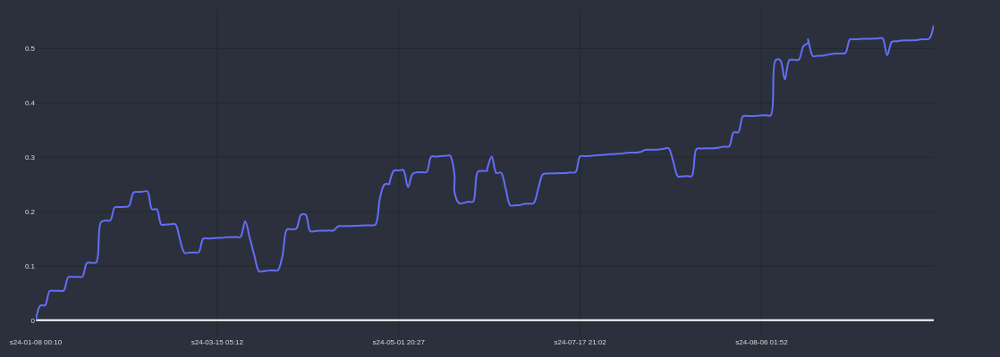

In [483]:
df_sorted_desc.iloc[4].r['time'] = df_sorted_desc.iloc[4].r['end_time']
df_sorted_desc.iloc[4].r['GAIN_C'] = df_sorted_desc.iloc[4].r.strategy.cumsum()

cp = CandlePlot(df_sorted_desc.iloc[4].r, candles=False)
cp.show_plot(line_traces = ['GAIN_C'])

In [484]:
def rank_backtest_results(df):
    # Definindo pesos para cada coluna com base na importância
    weights = {
        # 'Rel_len_pos_neg':1,
        # 'res': 0.5,
        # 'Rel_len':0.5,
        'strat': 0.4,           # Retorno acumulado percentual (maximizar)
        # 'Rel_len': 0.3,      # Relação de trades positivos/negativos (maximizar)
        'Rel_sum': 0.2,        # Relação de resultados positivos/negativos (maximizar)
        # 'l_p_s': 0.1,            # Quantidade de trades positivos (maximizar)
        # 'l_n_s': -0.1,           # Quantidade de trades negativos (minimizar)
        # 's_p_s': 0.05,           # Soma dos retornos positivos (maximizar)
        # 's_n_s': -0.05,          # Soma dos retornos negativos (minimizar)
        # 'c': -0.05,          # Média de candles até TP ou SL (minimizar)
        # 'max_o': -0.1,       # Máximo de operações abertas ao mesmo tempo (minimizar)
        # 'ema': -0.01,            # EMA short (minimizar)
        # 'tp': 0.1,             # Take profit percentual (minimizar)
        # 'sl': -0.05,             # Stop loss percentual (minimizar)
        # 'dw': -0.01              # Janela Donchian (minimizar)
    }
    
    # Normalizando as colunas relevantes
    for col in weights.keys():
        df[col + '_norm'] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())
    
    # Calculando o score ponderado para cada linha
    df['score'] = sum(
        df[col + '_norm'] * weight if weight >= 0 else (1 - df[col + '_norm']) * abs(weight) 
        for col, weight in weights.items()
    )
    
    # Ordenando o DataFrame pelos melhores resultados com base no score
    df_sorted = df.sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # Removendo colunas de normalização temporárias
    df_sorted.drop(columns=[col + '_norm' for col in weights.keys()], inplace=True)
    
    return df_sorted

In [485]:
df_LINKUSDT = df_res[df_res['pair']=='LINKUSDT']
df_DOTUSDT = df_res[df_res['pair']=='DOTUSDT']
df_DOGEUSDT = df_res[df_res['pair']=='DOGEUSDT']
df_ADAUSDT = df_res[df_res['pair']=='ADAUSDT']
df_XRPUSDT = df_res[df_res['pair']=='XRPUSDT']
df_LTCUSDT = df_res[df_res['pair']=='LTCUSDT']
df_TRXUSDT = df_res[df_res['pair']=='TRXUSDT']
df_XLMUSDT = df_res[df_res['pair']=='XLMUSDT']
df_AVAXUSDT = df_res[df_res['pair']=='AVAXUSDT']

In [486]:
df_ADAUSDT.columns

Index(['pair', 'granularity', 'ema_s', 'ema_l', 'strat', 'res', 'sig', 'c',
       'wp', 'ep', 'ep2', 'rsi_f', 'rsi_w', 'adx_f', 'adx_w', 'max_o', 'st',
       'force', 'sl_per', 's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat',
       'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg', 'sum_pos',
       'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg', 'first_p', 'last_p',
       'first_t', 'last_t', 'r'],
      dtype='object')

In [487]:
rank_LINK = rank_backtest_results(df_LINKUSDT)
rank_DOT = rank_backtest_results(df_DOTUSDT)
rank_DOGE = rank_backtest_results(df_DOGEUSDT)
rank_ADA = rank_backtest_results(df_ADAUSDT)
rank_XRP = rank_backtest_results(df_XRPUSDT)
rank_LTC = rank_backtest_results(df_LTCUSDT)
rank_TRX = rank_backtest_results(df_TRXUSDT)
rank_XLM = rank_backtest_results(df_XLMUSDT)
rank_AVAX = rank_backtest_results(df_AVAXUSDT)



In [488]:
rank_LINK[['pair', 'strat', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,LINKUSDT,0.184,2.268,75.846154,10,5000,14,5,-0.04,10,100,20,50,0.184183,-0.000000,1.000000,13,0,1.000000,13,0,11,2,2.295,0.027,0.846154,0.988372,2024-03-05 21:11:00,2024-08-05 16:51:00
1,LINKUSDT,0.173,2.025,151.166667,10,5000,14,5,-0.04,20,100,20,50,0.172874,-0.000000,1.000000,12,0,1.000000,12,0,10,2,2.035,0.010,0.833333,0.995110,2024-03-05 21:16:00,2024-08-05 16:48:00
2,LINKUSDT,0.416,6.779,242.556604,10,5000,14,3,-0.04,5,50,20,50,0.737688,0.321436,0.696508,98,8,0.924528,106,0,77,29,10.983,4.204,0.726415,0.723184,2024-01-08 07:04:00,2024-10-26 00:16:00
3,LINKUSDT,0.347,4.313,194.464286,10,5000,14,3,-0.04,5,100,20,50,0.513537,0.166604,0.755045,52,4,0.928571,56,0,46,10,6.340,2.027,0.821429,0.757739,2024-01-08 20:22:00,2024-10-26 00:47:00
4,LINKUSDT,0.213,3.016,227.076923,10,5000,14,5,-0.04,5,100,20,50,0.245871,0.032820,0.882236,12,1,0.923077,13,0,9,4,3.343,0.327,0.692308,0.910899,2024-03-05 21:09:00,2024-08-05 16:51:00
5,LINKUSDT,0.408,8.099,184.372549,10,5000,14,3,-0.04,10,20,20,50,0.839284,0.430877,0.660769,142,11,0.928105,153,0,109,44,13.245,5.146,0.712418,0.720189,2024-01-08 06:59:00,2024-10-26 02:02:00
6,LINKUSDT,0.429,7.368,203.207317,10,5000,14,3,-0.04,5,20,20,50,1.163856,0.734726,0.613013,146,18,0.890244,164,0,113,51,16.995,9.627,0.689024,0.638382,2024-01-08 06:57:00,2024-10-26 00:51:00
7,LINKUSDT,0.458,10.474,219.028571,10,5000,14,2,-0.03,10,50,20,50,1.834668,1.376185,0.571396,270,45,0.857143,315,0,226,89,30.048,19.574,0.717460,0.605538,2024-01-05 02:49:00,2024-10-31 20:48:00
8,LINKUSDT,0.470,10.050,231.375267,10,5000,14,2,-0.03,10,20,20,50,2.369712,1.899337,0.555091,406,63,0.865672,469,0,332,137,37.867,27.817,0.707889,0.576503,2024-01-05 03:10:00,2024-10-31 20:46:00
9,LINKUSDT,0.307,4.333,202.857143,10,5000,14,3,-0.04,10,100,20,50,0.514314,0.207283,0.712744,51,5,0.910714,56,0,42,14,6.763,2.430,0.750000,0.735668,2024-01-08 20:24:00,2024-10-26 00:51:00


In [489]:
rank_DOT[['pair', 'strat', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2', 'adx_f', 'adx_w',
              's_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,DOTUSDT,1.025,6.475,366.444444,10,5000,14,1,-0.04,50,100,20,50,2.744438,1.719172,0.614847,507,42,0.923497,549,2,440,109,18.927,12.452,0.801457,0.603174,2024-01-05 04:04:00,2024-10-31 23:25:00
1,DOTUSDT,0.178,1.116,153.588235,10,5000,14,5,-0.04,20,50,20,50,0.178417,-0.000000,1.000000,17,0,1.000000,17,0,14,3,1.167,0.051,0.823529,0.958128,2024-01-10 22:56:00,2024-08-05 17:00:00
2,DOTUSDT,0.175,1.059,143.058824,10,5000,14,5,-0.04,10,50,20,50,0.174917,-0.000000,1.000000,17,0,1.000000,17,0,15,2,1.084,0.025,0.882353,0.977457,2024-01-10 22:51:00,2024-08-05 17:00:00
3,DOTUSDT,0.108,0.698,83.800000,10,5000,14,5,-0.04,50,100,20,50,0.107930,-0.000000,1.000000,10,0,1.000000,10,0,10,0,0.698,-0.000,1.000000,1.000000,2024-01-10 23:52:00,2024-08-05 17:49:00
4,DOTUSDT,0.210,1.277,131.840000,10,5000,14,5,-0.04,10,20,20,50,0.265233,0.055262,0.827573,24,1,0.960000,25,0,19,6,1.752,0.475,0.760000,0.786709,2024-01-10 22:45:00,2024-08-05 18:45:00
5,DOTUSDT,0.562,3.904,288.083789,10,5000,14,1,-0.03,50,100,20,50,2.314412,1.752828,0.569037,492,57,0.896175,549,2,430,119,16.689,12.785,0.783242,0.566228,2024-01-05 04:04:00,2024-10-31 22:11:00
6,DOTUSDT,0.602,4.067,377.537975,10,5000,14,1,-0.04,20,50,20,50,4.086180,3.484450,0.539741,862,86,0.909283,948,3,751,197,29.735,25.668,0.792194,0.536704,2024-01-05 03:18:00,2024-10-31 23:25:00
7,DOTUSDT,0.083,0.470,117.000000,10,5000,14,5,-0.03,10,100,20,50,0.110874,0.028011,0.798316,12,1,0.923077,13,0,7,6,0.602,0.132,0.538462,0.820163,2024-01-10 23:34:00,2024-08-05 16:22:00
8,DOTUSDT,0.102,0.688,150.916667,10,5000,14,5,-0.04,20,100,20,50,0.142071,0.039943,0.780550,11,1,0.916667,12,0,8,4,0.877,0.189,0.666667,0.822702,2024-01-10 23:37:00,2024-08-05 17:00:00
9,DOTUSDT,0.296,2.599,153.873418,10,5000,14,3,-0.04,20,50,20,50,0.586016,0.290193,0.668808,72,7,0.911392,79,0,64,15,4.557,1.958,0.810127,0.699463,2024-01-06 07:22:00,2024-10-01 18:39:00


In [490]:
rank_DOGE[['pair', 'strat', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per',  'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,DOGEUSDT,0.057,0.007,17.913043,10,5000,14,5,-0.01,50,100,20,50,0.078042,0.021490,0.784093,19,4,0.826087,23,0,15,8,0.01281,0.00584,0.652174,0.686863,2024-02-28 17:59:00,2024-08-05 17:00:00
1,DOGEUSDT,0.047,0.001,52.478261,10,5000,14,5,-0.04,50,100,20,50,0.083814,0.037089,0.693231,22,1,0.956522,23,0,17,6,0.01152,0.01020,0.739130,0.530387,2024-02-28 17:59:00,2024-08-05 17:00:00
2,DOGEUSDT,0.086,0.010,47.214286,10,5000,14,4,-0.03,50,100,20,50,0.201231,0.114847,0.636649,38,4,0.904762,42,0,31,11,0.03109,0.02087,0.738095,0.598345,2024-01-21 00:04:00,2024-10-16 11:04:00
3,DOGEUSDT,0.061,0.004,68.119048,10,5000,14,4,-0.04,50,100,20,50,0.141433,0.080707,0.636684,40,2,0.952381,42,0,31,11,0.02101,0.01653,0.738095,0.559670,2024-01-21 00:04:00,2024-10-16 11:04:00
4,DOGEUSDT,0.113,0.011,18.032258,10,5000,14,5,-0.01,10,20,20,50,0.467901,0.354814,0.568728,61,32,0.655914,93,0,54,39,0.06317,0.05212,0.580645,0.547923,2024-01-20 23:40:00,2024-10-29 17:14:00
5,DOGEUSDT,0.155,0.032,124.271574,10,5000,14,2,-0.03,20,50,20,50,1.694158,1.538862,0.524017,344,50,0.873096,394,1,282,112,0.26017,0.22780,0.715736,0.533168,2024-01-06 07:23:00,2024-10-31 15:37:00
6,DOGEUSDT,0.075,0.011,12.816667,10,5000,14,5,-0.01,10,50,20,50,0.293062,0.218161,0.573257,40,20,0.666667,60,0,34,26,0.04235,0.03143,0.566667,0.574004,2024-02-28 17:34:00,2024-10-16 10:47:00
7,DOGEUSDT,0.136,0.033,42.643038,10,5000,14,2,-0.01,20,50,20,50,1.511743,1.375408,0.523611,270,125,0.683544,395,0,237,158,0.21884,0.18590,0.600000,0.540693,2024-01-06 07:23:00,2024-10-31 22:15:00
8,DOGEUSDT,0.071,0.008,16.414141,10,5000,14,5,-0.01,5,20,20,50,0.430293,0.359492,0.544823,67,32,0.676768,99,0,53,46,0.06017,0.05263,0.535354,0.533422,2024-01-20 23:37:00,2024-10-29 17:14:00
9,DOGEUSDT,0.084,0.011,20.678082,10,5000,14,4,-0.01,10,20,20,50,0.627957,0.543629,0.535989,96,50,0.657534,146,0,87,59,0.08782,0.07651,0.595890,0.534412,2024-01-10 22:50:00,2024-10-29 17:14:00


In [491]:
rank_ADA[['pair', 'strat', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,ADAUSDT,1.158,0.798,370.414739,10,5000,14,1,-0.04,5,50,20,50,5.335688,4.178116,0.560836,1065,102,0.912596,1167,3,913,254,2.7857,1.9881,0.782348,0.583539,2024-01-05 03:57:00,2024-10-31 19:03:00
1,ADAUSDT,1.035,0.794,400.600408,10,5000,14,1,-0.04,20,50,20,50,4.621377,3.586783,0.563022,893,88,0.910296,981,2,749,232,2.4319,1.6379,0.763507,0.597548,2024-01-05 04:26:00,2024-10-31 19:40:00
2,ADAUSDT,0.611,0.361,306.006452,10,5000,14,2,-0.04,5,50,20,50,1.676729,1.065232,0.611507,284,26,0.916129,310,1,236,74,0.8981,0.5369,0.761290,0.625854,2024-01-05 02:42:00,2024-10-26 20:49:00
3,ADAUSDT,0.675,0.596,290.691446,10,5000,14,1,-0.03,20,50,20,50,4.379826,3.704713,0.541753,862,120,0.877800,982,1,726,256,2.2755,1.6798,0.739308,0.575304,2024-01-05 04:26:00,2024-10-31 19:40:00
4,ADAUSDT,0.646,0.494,293.274151,10,5000,14,1,-0.03,5,100,20,50,3.627320,2.981083,0.548895,669,97,0.873368,766,1,578,188,1.9057,1.4116,0.754569,0.574473,2024-01-05 02:50:00,2024-10-31 19:26:00
5,ADAUSDT,0.622,0.563,335.236893,10,5000,14,1,-0.04,10,20,20,50,6.483318,5.861228,0.525197,1401,144,0.906796,1545,3,1181,364,3.3970,2.8339,0.764401,0.545186,2024-01-05 03:05:00,2024-10-31 19:03:00
6,ADAUSDT,0.609,0.487,260.752568,10,5000,14,1,-0.03,5,50,20,50,4.887815,4.278939,0.533211,1030,138,0.881849,1168,2,888,280,2.5106,2.0235,0.760274,0.553715,2024-01-05 03:57:00,2024-10-31 19:03:00
7,ADAUSDT,0.527,0.338,311.685315,10,5000,14,2,-0.04,10,50,20,50,1.460419,0.933432,0.610071,263,23,0.919580,286,1,229,57,0.8012,0.4634,0.800699,0.633560,2024-01-05 02:44:00,2024-10-26 00:36:00
8,ADAUSDT,0.575,0.551,335.962141,10,5000,14,1,-0.04,5,100,20,50,3.577129,3.002539,0.543664,691,75,0.902089,766,1,592,174,1.9949,1.4439,0.772846,0.580115,2024-01-05 02:50:00,2024-10-31 19:26:00
9,ADAUSDT,0.076,0.034,164.666667,10,5000,14,4,-0.04,50,100,20,50,0.076050,-0.000000,1.000000,15,0,1.000000,15,0,13,2,0.0345,0.0009,0.866667,0.974576,2024-01-10 23:54:00,2024-08-05 17:05:00


In [492]:
rank_XRP[['pair', 'strat', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per',  'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,XRPUSDT,0.790,0.449,349.919598,10,5000,14,2,-0.04,5,50,20,50,1.237842,0.447599,0.734432,188,11,0.944724,199,0,155,44,0.7078,0.2585,0.778894,0.732485,2024-01-07 23:53:00,2024-10-28 14:01:00
1,XRPUSDT,0.686,0.388,372.456989,10,5000,14,2,-0.04,10,50,20,50,1.049283,0.363390,0.742764,177,9,0.951613,186,0,143,43,0.6010,0.2128,0.768817,0.738511,2024-01-07 23:56:00,2024-10-31 06:39:00
2,XRPUSDT,0.703,0.386,181.865591,10,5000,14,2,-0.03,10,50,20,50,1.206357,0.503591,0.705493,170,16,0.913978,186,0,140,46,0.6814,0.2956,0.752688,0.697441,2024-01-07 23:56:00,2024-10-27 08:43:00
3,XRPUSDT,0.148,0.082,146.208333,10,5000,14,4,-0.04,10,50,20,50,0.147728,-0.000000,1.000000,24,0,1.000000,24,0,18,6,0.0902,0.0078,0.750000,0.920408,2024-01-10 23:26:00,2024-10-03 03:05:00
4,XRPUSDT,0.117,0.057,331.400000,10,5000,14,4,-0.04,20,50,20,50,0.116515,-0.000000,1.000000,20,0,1.000000,20,0,15,5,0.0659,0.0086,0.750000,0.884564,2024-01-10 23:29:00,2024-10-02 23:13:00
5,XRPUSDT,0.543,0.308,207.869347,10,5000,14,2,-0.03,5,50,20,50,1.136766,0.594041,0.656784,179,20,0.899497,199,0,149,50,0.6545,0.3467,0.748744,0.653716,2024-01-07 23:53:00,2024-10-27 08:48:00
6,XRPUSDT,0.079,0.037,486.916667,10,5000,14,5,-0.04,20,50,20,50,0.078810,-0.000000,1.000000,12,0,1.000000,12,0,8,4,0.0458,0.0085,0.666667,0.843462,2024-03-05 20:55:00,2024-10-02 23:13:00
7,XRPUSDT,0.077,0.046,134.461538,10,5000,14,5,-0.04,10,50,20,50,0.077004,-0.000000,1.000000,13,0,1.000000,13,0,10,3,0.0502,0.0044,0.769231,0.919414,2024-03-05 20:52:00,2024-10-02 23:18:00
8,XRPUSDT,0.678,0.542,463.619226,10,5000,14,1,-0.04,5,50,20,50,3.923875,3.246184,0.547258,721,80,0.900125,801,1,611,190,2.3196,1.7773,0.762797,0.566184,2024-01-05 02:41:00,2024-10-31 17:00:00
9,XRPUSDT,0.056,0.030,33.857143,10,5000,14,5,-0.02,50,100,20,50,0.056187,-0.000000,1.000000,7,0,1.000000,7,0,7,0,0.0298,-0.0000,1.000000,1.000000,2024-03-05 21:22:00,2024-08-07 22:52:00


In [493]:
rank_LTC[['pair', 'strat', 'res','c','ema_l', 'st', 'force', 'sl_per', 'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,LTCUSDT,0.498,60.51,404.105578,5000,14,1,-0.04,10,100,20,50,2.200381,1.702698,0.563755,459,43,0.914343,502,1,410,92,193.49,132.98,0.816733,0.592673,2024-01-05 04:30:00,2024-10-31 23:41:00
1,LTCUSDT,0.488,52.25,417.640969,5000,14,1,-0.04,20,100,20,50,2.138120,1.649847,0.564451,413,41,0.909692,454,2,358,96,181.85,129.60,0.788546,0.583882,2024-01-05 04:32:00,2024-10-31 23:49:00
2,LTCUSDT,0.039,2.78,51.666667,5000,14,4,-0.04,50,100,20,50,0.038559,-0.000000,1.000000,12,0,1.000000,12,0,9,3,3.13,0.35,0.750000,0.899425,2024-02-29 06:53:00,2024-08-05 18:30:00
3,LTCUSDT,0.038,2.92,58.333333,5000,14,5,-0.04,50,100,20,50,0.037959,-0.000000,1.000000,9,0,1.000000,9,0,7,2,3.05,0.13,0.777778,0.959119,2024-02-29 06:53:00,2024-08-05 18:30:00
4,LTCUSDT,0.030,2.42,57.000000,5000,14,5,-0.03,50,100,20,50,0.029864,-0.000000,1.000000,9,0,1.000000,9,0,7,2,2.55,0.13,0.777778,0.951493,2024-02-29 06:53:00,2024-08-05 18:30:00
5,LTCUSDT,0.030,2.28,50.666667,5000,14,4,-0.03,50,100,20,50,0.030464,-0.000000,1.000000,12,0,1.000000,12,0,9,3,2.63,0.35,0.750000,0.882550,2024-02-29 06:53:00,2024-08-05 18:30:00
6,LTCUSDT,0.297,25.68,272.646018,5000,14,2,-0.04,5,100,20,50,0.748258,0.451128,0.623868,102,11,0.902655,113,0,87,26,62.11,36.43,0.769912,0.630302,2024-01-08 03:51:00,2024-10-26 02:00:00
7,LTCUSDT,0.343,46.77,308.420584,5000,14,1,-0.03,5,50,20,50,3.037374,2.694124,0.529944,698,89,0.886912,787,2,607,180,253.41,206.64,0.771283,0.550831,2024-01-05 03:10:00,2024-10-31 23:49:00
8,LTCUSDT,0.324,49.34,333.466937,5000,14,1,-0.03,10,50,20,50,3.030090,2.705677,0.528280,651,90,0.878543,741,2,549,192,253.18,203.84,0.740891,0.553980,2024-01-05 02:45:00,2024-10-31 23:49:00
9,LTCUSDT,0.319,50.56,449.865047,5000,14,1,-0.04,10,50,20,50,2.865218,2.546101,0.529486,677,64,0.913630,741,2,565,176,245.45,194.89,0.762483,0.557410,2024-01-05 02:45:00,2024-10-31 23:49:00


In [494]:
rank_TRX[['pair', 'strat', 'res','c','ema_l', 'st', 'force', 'sl_per', 'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,TRXUSDT,0.372,0.051,1278.822222,5000,14,1,-0.02,20,50,20,50,1.029914,0.658124,0.610125,104,31,0.770370,135,0,93,42,0.13558,0.08490,0.688889,0.614931,2024-01-06 07:21:00,2024-10-27 08:38:00
1,TRXUSDT,0.202,0.024,2352.615385,5000,14,2,-0.04,10,50,20,50,0.242441,0.040021,0.858315,25,1,0.961538,26,0,19,7,0.02952,0.00546,0.730769,0.843911,2024-01-13 10:38:00,2024-08-25 16:32:00
2,TRXUSDT,0.312,0.039,2279.214815,5000,14,1,-0.04,20,50,20,50,1.121855,0.810113,0.580680,114,21,0.844444,135,0,100,35,0.14757,0.10828,0.740741,0.576783,2024-01-06 07:21:00,2024-10-31 14:34:00
3,TRXUSDT,0.184,0.023,2354.000000,5000,14,2,-0.02,20,50,20,50,0.226130,0.042546,0.841646,20,2,0.909091,22,0,18,4,0.02862,0.00537,0.818182,0.842012,2024-01-13 10:43:00,2024-08-25 17:40:00
4,TRXUSDT,0.170,0.021,2691.727273,5000,14,2,-0.04,20,50,20,50,0.210228,0.040021,0.840076,21,1,0.954545,22,0,18,4,0.02590,0.00498,0.818182,0.838731,2024-01-13 10:43:00,2024-08-25 17:40:00
5,TRXUSDT,0.254,0.036,1095.806122,5000,14,1,-0.03,5,100,20,50,0.804086,0.550545,0.593583,79,19,0.806122,98,0,70,28,0.10868,0.07258,0.714286,0.599581,2024-01-06 07:22:00,2024-10-13 09:36:00
6,TRXUSDT,0.078,0.008,581.916667,5000,14,3,-0.03,5,20,20,50,0.077668,-0.000000,1.000000,12,0,1.000000,12,0,9,3,0.00969,0.00153,0.750000,0.863636,2024-01-13 10:29:00,2024-08-21 01:05:00
7,TRXUSDT,0.240,0.034,904.530612,5000,14,1,-0.02,5,100,20,50,0.773084,0.533022,0.591900,73,25,0.744898,98,0,66,32,0.10234,0.06837,0.673469,0.599496,2024-01-06 07:22:00,2024-10-13 09:36:00
8,TRXUSDT,0.070,0.007,636.416667,5000,14,3,-0.04,5,20,20,50,0.070011,-0.000000,1.000000,12,0,1.000000,12,0,9,3,0.00883,0.00153,0.750000,0.852317,2024-01-13 10:29:00,2024-08-21 01:05:00
9,TRXUSDT,0.214,0.034,1153.916667,5000,14,1,-0.03,50,100,20,50,0.482420,0.268604,0.642350,62,10,0.861111,72,0,53,19,0.06726,0.03312,0.736111,0.670054,2024-01-06 07:34:00,2024-10-13 14:20:00


In [495]:
rank_XLM[['pair', 'strat', 'res','c','ema_l', 'st', 'force', 'sl_per', 'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,XLMUSDT,0.478,0.057,323.139535,5000,14,2,-0.04,20,100,20,50,0.801257,0.323712,0.712248,78,8,0.906977,86,0,64,22,0.0899,0.0332,0.744186,0.730301,2024-01-10 23:45:00,2024-10-02 18:16:00
1,XLMUSDT,0.344,0.032,251.125000,5000,14,3,-0.04,5,100,20,50,0.465340,0.121732,0.792646,29,3,0.906250,32,0,24,8,0.0449,0.0125,0.750000,0.782230,2024-03-04 12:19:00,2024-08-07 22:34:00
2,XLMUSDT,0.355,0.049,317.009091,5000,14,2,-0.04,10,20,20,50,1.321029,0.966091,0.577595,197,23,0.895455,220,0,146,74,0.1555,0.1063,0.663636,0.593965,2024-01-10 22:51:00,2024-10-26 00:00:00
3,XLMUSDT,0.253,0.025,148.625000,5000,14,3,-0.03,5,100,20,50,0.377101,0.124354,0.752013,28,4,0.875000,32,0,23,9,0.0370,0.0125,0.718750,0.747475,2024-03-04 12:19:00,2024-08-07 22:34:00
4,XLMUSDT,0.244,0.023,164.827586,5000,14,3,-0.04,20,100,20,50,0.367655,0.123547,0.748480,26,3,0.896552,29,0,24,5,0.0345,0.0114,0.827586,0.751634,2024-03-04 12:26:00,2024-08-07 22:40:00
5,XLMUSDT,0.299,0.034,308.255102,5000,14,2,-0.04,5,100,20,50,0.802527,0.503680,0.614395,86,12,0.877551,98,0,64,34,0.0918,0.0581,0.653061,0.612408,2024-01-10 23:37:00,2024-10-01 19:04:00
6,XLMUSDT,0.085,0.009,70.300000,5000,14,5,-0.04,20,100,20,50,0.085241,-0.000000,1.000000,10,0,1.000000,10,0,9,1,0.0095,-0.0000,0.900000,1.000000,2024-03-05 21:20:00,2024-08-07 22:40:00
7,XLMUSDT,0.083,0.009,136.800000,5000,14,5,-0.04,5,100,20,50,0.082966,-0.000000,1.000000,10,0,1.000000,10,0,8,2,0.0090,0.0004,0.800000,0.957447,2024-03-05 21:13:00,2024-08-07 22:34:00
8,XLMUSDT,0.309,0.042,226.204545,5000,14,2,-0.03,10,20,20,50,1.333506,1.024666,0.565483,187,33,0.850000,220,0,141,79,0.1544,0.1121,0.640909,0.579362,2024-01-10 22:51:00,2024-10-26 00:00:00
9,XLMUSDT,0.315,0.049,458.868715,5000,14,1,-0.04,20,100,20,50,1.766238,1.451513,0.548905,323,35,0.902235,358,0,257,101,0.2116,0.1628,0.717877,0.565171,2024-01-05 04:38:00,2024-10-26 02:04:00


In [496]:
rank_AVAX[['pair', 'strat', 'res','c','ema_l', 'st', 'force', 'sl_per', 'ep','ep2', 'adx_f', 'adx_w','s_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg',
       'sum_pos', 'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg','first_t', 'last_t']].head(10)

,pair,strat,res,c,ema_l,st,force,sl_per,ep,ep2,adx_f,adx_w,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_t,last_t
0,AVAXUSDT,1.076,58.45,217.988170,5000,14,1,-0.03,20,50,20,50,6.171868,5.095669,0.547757,1104,164,0.870662,1268,3,923,345,233.48,175.03,0.727918,0.571540,2024-01-05 04:35:00,2024-10-30 11:41:00
1,AVAXUSDT,0.792,62.69,226.853147,5000,14,1,-0.03,10,50,20,50,6.816775,6.024799,0.530836,1235,195,0.863636,1430,2,1053,377,265.50,202.81,0.736364,0.566932,2024-01-05 04:31:00,2024-10-31 22:11:00
2,AVAXUSDT,0.720,46.02,291.294164,5000,14,1,-0.04,20,50,20,50,6.411426,5.691296,0.529751,1130,138,0.891167,1268,3,944,324,243.68,197.66,0.744479,0.552137,2024-01-05 04:35:00,2024-10-31 23:23:00
3,AVAXUSDT,0.544,24.94,160.023377,5000,14,2,-0.03,20,50,20,50,2.150677,1.606359,0.572440,333,52,0.864935,385,0,273,112,84.24,59.30,0.709091,0.586875,2024-01-05 04:35:00,2024-10-26 13:47:00
4,AVAXUSDT,0.402,15.13,134.913907,5000,14,3,-0.03,20,50,20,50,0.942485,0.540709,0.635443,134,17,0.887417,151,0,108,43,37.24,22.11,0.715232,0.627464,2024-01-06 07:16:00,2024-10-26 13:47:00
5,AVAXUSDT,0.153,4.42,94.125000,5000,14,5,-0.04,5,50,20,50,0.230051,0.077347,0.748383,30,2,0.937500,32,0,21,11,8.14,3.72,0.656250,0.686341,2024-01-10 23:27:00,2024-10-01 20:25:00
6,AVAXUSDT,0.434,22.72,161.232227,5000,14,2,-0.03,10,50,20,50,2.214748,1.780719,0.554315,364,58,0.862559,422,0,314,108,86.86,64.14,0.744076,0.575232,2024-01-05 04:31:00,2024-10-26 13:51:00
7,AVAXUSDT,0.394,18.87,166.896321,5000,14,2,-0.03,5,100,20,50,1.593574,1.200073,0.570428,260,39,0.869565,299,0,208,91,62.66,43.79,0.695652,0.588633,2024-01-05 04:33:00,2024-10-26 14:57:00
8,AVAXUSDT,0.470,28.95,285.360225,5000,14,1,-0.04,5,100,20,50,4.984162,4.513734,0.524765,956,110,0.896811,1066,3,795,271,187.77,158.82,0.745779,0.541764,2024-01-05 04:33:00,2024-10-31 22:17:00
9,AVAXUSDT,0.072,1.42,144.764706,5000,14,5,-0.04,5,100,20,50,0.115547,0.043414,0.726888,16,1,0.941176,17,0,12,5,3.50,2.08,0.705882,0.627240,2024-01-10 23:37:00,2024-09-19 01:37:00


In [497]:
# def rank_tests(df, total_investment):
#     # Calcula o capital fracionado para cada teste com base em max_o
#     df['capital_fracionado'] = total_investment / df['max_o']
    
#     # Calcula o retorno total ajustado, considerando o capital fracionado e o retorno percentual (strat)
#     df['retorno_ajustado'] = df['capital_fracionado'] * df['strat']
    
#     # Ordena o DataFrame pelo retorno ajustado em ordem decrescente
#     ranked_df = df.sort_values(by='retorno_ajustado', ascending=False).reset_index(drop=True)
    
#     return ranked_df

In [498]:
# total_investment = 5000
# rank_ADAUSDT_inv = rank_tests(rank_ADAUSDT, total_investment)
# rank_ADAUSDT_inv[['pair', 'strat', 'res', 'force', 's_p_strat', 's_n_strat', 'Rel_sum',
#        'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg','capital_fracionado','retorno_ajustado']].head(10)

In [499]:
# total_investment = 5000
# rank_BTCUSDT_inv = rank_tests(rank_BTCUSDT, total_investment)
# rank_BTCUSDT_inv[['pair', 'strat', 'res', 'force', 's_p_strat', 's_n_strat', 'Rel_sum',
#        'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg','capital_fracionado','retorno_ajustado']].head(10)

In [500]:
# total_investment = 5000
# rank_ETHUSDT_inv = rank_tests(rank_ETHUSDT, total_investment)
# rank_ETHUSDT_inv[['pair', 'strat', 'res', 'force', 's_p_strat', 's_n_strat', 'Rel_sum',
#        'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg','capital_fracionado','retorno_ajustado']].head(10)

In [501]:
# total_investment = 5000
# rank_BNBUSDT_inv = rank_tests(rank_BNBUSDT, total_investment)
# rank_BNBUSDT_inv[['pair', 'strat', 'res', 'force', 's_p_strat', 's_n_strat', 'Rel_sum',
#        'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg','capital_fracionado','retorno_ajustado']].head(10)

In [502]:
# total_investment = 5000
# rank_XRPUSDT_inv = rank_tests(rank_XRPUSDT, total_investment)
# rank_XRPUSDT_inv[['pair', 'strat', 'res', 'force', 's_p_strat', 's_n_strat', 'Rel_sum',
#        'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg','capital_fracionado','retorno_ajustado']].head(10)

In [503]:
# total_investment = 5000
# rank_LTCUSDT_inv = rank_tests(rank_LTCUSDT, total_investment)
# rank_LTCUSDT_inv[['pair', 'strat', 'res', 'force', 's_p_strat', 's_n_strat', 'Rel_sum',
#        'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg','capital_fracionado','retorno_ajustado']].head(10)

In [504]:
# rank_LTCUSDT_inv.columns

In [505]:
# df_results = res[108]['res'].df_results
# pair = res[108]['pair']
# print(pair)
# print(df_results.columns)
# res_pos = df_results[df_results['strategy'] > 0]
# res_neg = df_results[df_results['strategy'] < 0]
# df_results.shape, res_pos.shape, res_neg.shape

In [506]:
def calcular_operacoes_simultaneas(df):
    # Ordena o DataFrame por start_time para facilitar o cálculo
    df = df.sort_values(by='start_time').reset_index(drop=True)
    # Inicializa a coluna operacoes_simultaneas com o valor mínimo de 0
    df['operacoes_simultaneas'] = 0
    
    # Itera sobre cada operação e conta quantas estão abertas e não fechadas no momento
    for i, row in df.iterrows():
        # Conta quantas operações estão em andamento no tempo de start_time da operação atual
        count = ((df['start_time'] <= row['start_time']) & (df['end_time'] > row['start_time'])).sum()
        # Atualiza a coluna com o número de operações simultâneas, garantindo o mínimo de 1
        df.at[i, 'operacoes_simultaneas'] = max(count, 1)
        
    return df

In [507]:
# concat_ranks = pd.concat([
#                           rank_ADAUSDT_inv.iloc[0].r,
#                           rank_BTCUSDT_inv.iloc[0].r, 
#                           rank_ETHUSDT_inv.iloc[0].r, 
#                           rank_BNBUSDT_inv.iloc[0].r, 
#                           rank_XRPUSDT_inv.iloc[0].r, 
#                           rank_LTCUSDT_inv.iloc[0].r])


concat_ranks = pd.concat([
    rank_LINK.iloc[0].r,
    rank_LINK.iloc[1].r,
    rank_LINK.iloc[2].r,
    rank_LINK.iloc[3].r,
    rank_LINK.iloc[4].r,
    # rank_ADAUSDT.iloc[5].r,
    # rank_ADAUSDT.iloc[6].r,
    # rank_ADAUSDT.iloc[7].r,
    # rank_ADAUSDT.iloc[8].r,
    # rank_ADAUSDT.iloc[9].r,
    # rank_ADAUSDT.iloc[10].r,
    
    rank_DOT.iloc[0].r,
    rank_DOT.iloc[1].r,
    rank_DOT.iloc[2].r,
    rank_DOT.iloc[3].r,
    rank_DOT.iloc[4].r,
    # rank_BTCUSDT.iloc[5].r,
    # rank_BTCUSDT.iloc[6].r,
    # rank_BTCUSDT.iloc[7].r,
    # rank_BTCUSDT.iloc[8].r,
    # rank_BTCUSDT.iloc[9].r,
    # rank_BTCUSDT.iloc[10].r,
    
    rank_DOGE.iloc[0].r,
    rank_DOGE.iloc[1].r,
    rank_DOGE.iloc[2].r,
    rank_DOGE.iloc[3].r,
    rank_DOGE.iloc[4].r,
    # rank_ETHUSDT.iloc[5].r,
    # rank_ETHUSDT.iloc[6].r,
    # rank_ETHUSDT.iloc[7].r,
    # rank_ETHUSDT.iloc[8].r,
    # rank_ETHUSDT.iloc[9].r,
    # rank_ETHUSDT.iloc[10].r,
    
    rank_ADA.iloc[0].r,
    rank_ADA.iloc[1].r,
    rank_ADA.iloc[2].r,
    rank_ADA.iloc[3].r,
    rank_ADA.iloc[4].r,
    # rank_BNBUSDT.iloc[5].r,
    # rank_BNBUSDT.iloc[6].r,
    # rank_BNBUSDT.iloc[7].r,
    # rank_BNBUSDT.iloc[8].r,
    # rank_BNBUSDT.iloc[9].r,
    # rank_BNBUSDT.iloc[10].r,
    
    rank_XRP.iloc[0].r,
    rank_XRP.iloc[1].r,
    rank_XRP.iloc[2].r,
    rank_XRP.iloc[3].r,
    rank_XRP.iloc[4].r,
    # rank_XRPUSDT.iloc[5].r,
    # rank_XRPUSDT.iloc[6].r,
    # rank_XRPUSDT.iloc[7].r,
    # rank_XRPUSDT.iloc[8].r,
    # rank_XRPUSDT.iloc[9].r,
    # rank_XRPUSDT.iloc[10].r,
    
    rank_LTC.iloc[0].r,
    rank_LTC.iloc[1].r,
    rank_LTC.iloc[2].r,
    rank_LTC.iloc[3].r,
    rank_LTC.iloc[4].r,
#     rank_LTCUSDT.iloc[5].r,
#     rank_LTCUSDT.iloc[6].r,
#     rank_LTCUSDT.iloc[7].r,
#     rank_LTCUSDT.iloc[8].r,
#     rank_LTCUSDT.iloc[9].r,
#     rank_LTCUSDT.iloc[10].r,

    rank_TRX.iloc[0].r,
    rank_TRX.iloc[1].r,
    rank_TRX.iloc[2].r,
    rank_TRX.iloc[3].r,
    rank_TRX.iloc[4].r,
#     rank_LTCUSDT.iloc[5].r,
#     rank_LTCUSDT.iloc[6].r,
#     rank_LTCUSDT.iloc[7].r,
#     rank_LTCUSDT.iloc[8].r,
#     rank_LTCUSDT.iloc[9].r,
#     rank_LTCUSDT.iloc[10].r,


    rank_XLM.iloc[0].r,
    rank_XLM.iloc[1].r,
    rank_XLM.iloc[2].r,
    rank_XLM.iloc[3].r,
    rank_XLM.iloc[4].r,
#     rank_LTCUSDT.iloc[5].r,
#     rank_LTCUSDT.iloc[6].r,
#     rank_LTCUSDT.iloc[7].r,
#     rank_LTCUSDT.iloc[8].r,
#     rank_LTCUSDT.iloc[9].r,
#     rank_LTCUSDT.iloc[10].r,


    rank_AVAX.iloc[0].r,
    rank_AVAX.iloc[1].r,
    rank_AVAX.iloc[2].r,
    rank_AVAX.iloc[3].r,
    rank_AVAX.iloc[4].r,
#     rank_LTCUSDT.iloc[5].r,
#     rank_LTCUSDT.iloc[6].r,
#     rank_LTCUSDT.iloc[7].r,
#     rank_LTCUSDT.iloc[8].r,
#     rank_LTCUSDT.iloc[9].r,
#     rank_LTCUSDT.iloc[10].r,
])


df_test = calcular_operacoes_simultaneas(concat_ranks)
df_test.operacoes_simultaneas.max()

np.int64(60)

In [508]:
concat_ranks.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'stop_loss_percent', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time'],
      dtype='object')

In [509]:
df_test.strategy.sum()

np.float64(17.500853861206053)

In [510]:
(5000/df_test.operacoes_simultaneas.max()) * df_test.strategy.sum()

np.float64(1458.4044884338377)

In [511]:
df_test.tail()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,operacoes_simultaneas
12084,False,433399,195,0,0.000804,0.001604,3,False,1,-0.03,0.03,0.001,buy,24.910,24.950,1,0,0.040,2024-10-31 22:11:00,2024-10-31 18:57:00,9
12085,False,433403,289,0,0.000200,0.000722,3,False,1,-0.04,0.04,0.001,buy,69.210,69.260,1,0,0.050,2024-10-31 23:49:00,2024-10-31 19:01:00,10
12086,False,433404,50,0,0.000200,0.000764,5,False,1,-0.04,0.04,0.001,buy,3.924,3.927,1,0,0.003,2024-10-31 19:51:00,2024-10-31 19:02:00,11
12087,False,433453,52,0,0.000408,0.001208,4,False,1,-0.03,0.03,0.001,buy,24.820,24.850,1,0,0.030,2024-10-31 20:42:00,2024-10-31 19:51:00,7
12088,False,433491,107,0,0.000200,0.000290,3,False,1,-0.04,0.04,0.001,buy,68.900,68.920,1,0,0.020,2024-10-31 22:15:00,2024-10-31 20:29:00,8


In [512]:
rank_ADAUSDT.iloc[0].r.tail()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
1078,False,385263,758,0,0.000208,1.008319e-03,1,False,1,-0.04,0.04,0.001,buy,0.3965,0.3969,1,0,0.0004,2024-09-28 21:18:00,2024-09-28 08:41:00
1079,False,387832,128,0,0.000200,5.138746e-04,3,False,1,-0.04,0.04,0.001,buy,0.3891,0.3893,1,0,0.0002,2024-09-30 05:37:00,2024-09-30 03:30:00
1080,False,387779,243,0,0.000226,1.025641e-03,2,False,1,-0.04,0.04,0.001,buy,0.3898,0.3902,1,0,0.0004,2024-09-30 06:39:00,2024-09-30 02:37:00
1081,False,388276,190,0,0.000200,-1.466275e-15,2,False,1,-0.04,0.04,0.001,buy,0.3831,0.3831,1,0,0.0000,2024-09-30 14:03:00,2024-09-30 10:54:00
1082,False,387682,896,0,-0.040345,-3.954514e-02,1,False,0,-0.04,0.04,-0.040,buy,0.3946,0.3793,1,0,-0.0153,2024-09-30 15:55:00,2024-09-30 01:00:00


In [513]:
# ranks = [
#         rank_LINK,
#          rank_DOT, 
#          rank_DOGE, 
#          rank_ADA, 
#          rank_XRP, 
#          rank_LTC,
#           rank_TRX,
#     rank_XLM,
#     rank_AVAX
# ]

# for rank in ranks:
#     first_p = rank.iloc[0].first_p
#     last_p = rank.iloc[0].last_p
#     rel_first_last = (last_p - first_p)/last_p
#     print(rank.iloc[0].pair, first_p, last_p, rel_first_last )
#     rank.iloc[0].r['time'] = rank.iloc[0].r['end_time']
#     rank.iloc[0].r['GAIN_C'] = rank.iloc[0].r.strategy.cumsum()

#     cp = CandlePlot(rank.iloc[0].r, candles=False)
#     cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['total_opened'])

In [514]:
rank = rank_LINK

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)



LINKUSDT 14.597 11.41 -0.27931638913233997


In [515]:
rank = rank_DOT

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

DOTUSDT 7.906 3.958 -0.9974734714502272


DOGEUSDT 0.08387 0.16163 0.4810988059147435


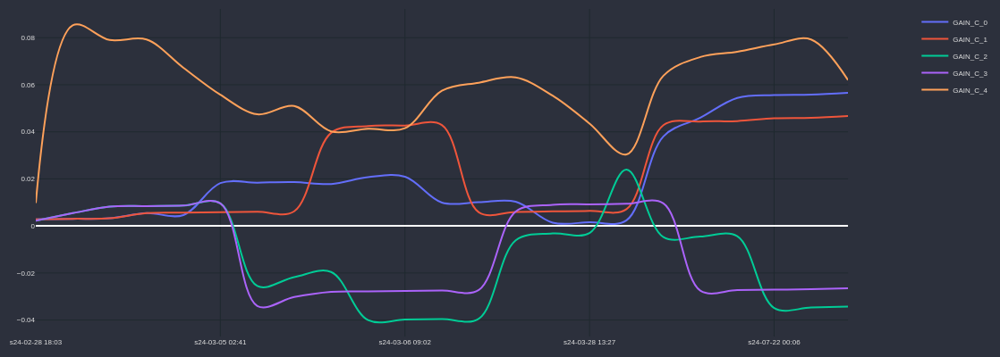

In [516]:

rank = rank_DOGE

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

In [517]:

rank = rank_ADA

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

ADAUSDT 0.572 0.3418 -0.6734932709186657


In [518]:
rank.iloc[3].r.strategy.sum()

np.float64(0.6751129774429298)

XRPUSDT 0.5868 0.5095 -0.15171736997055946


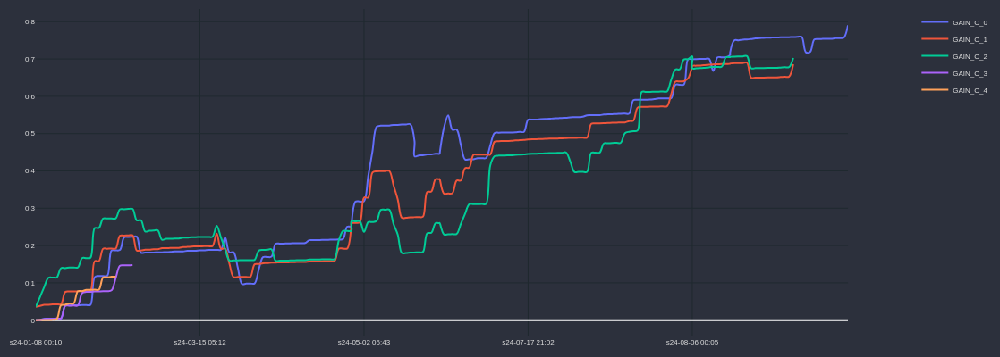

In [519]:

rank = rank_XRP

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

LTCUSDT 66.23 69.27 0.04388624224050804


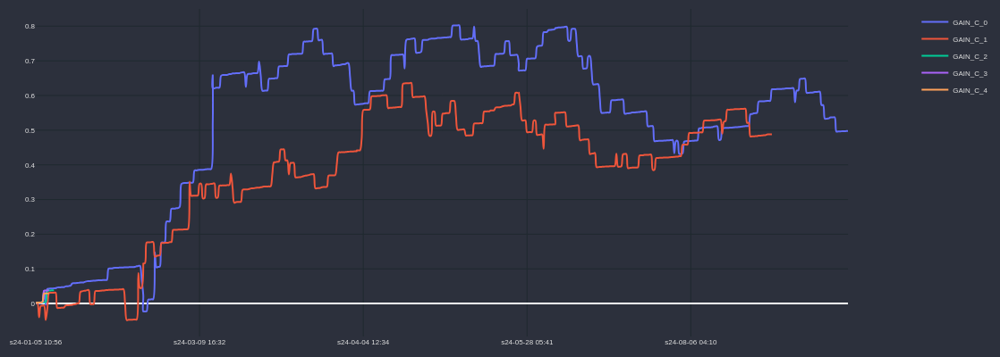

In [520]:

rank = rank_LTC

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

TRXUSDT 0.10688 0.1683 0.3649435531788473


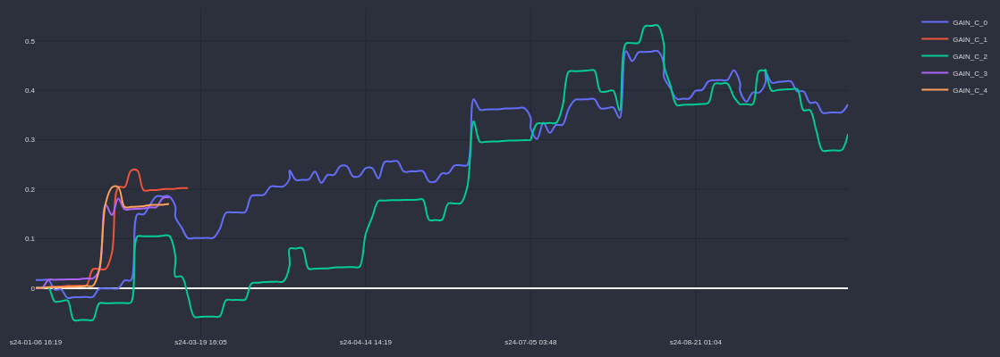

In [521]:

rank = rank_TRX

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

XLMUSDT 0.121 0.0924 -0.30952380952380953


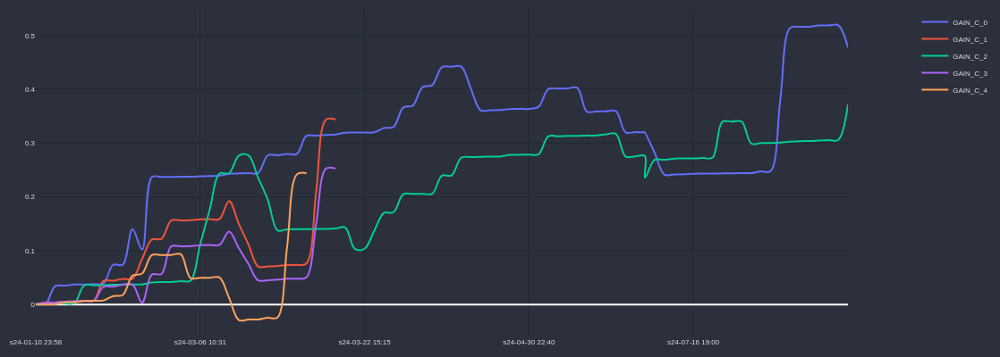

In [522]:

rank = rank_XLM

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

AVAXUSDT 38.97 24.99 -0.5594237695078031


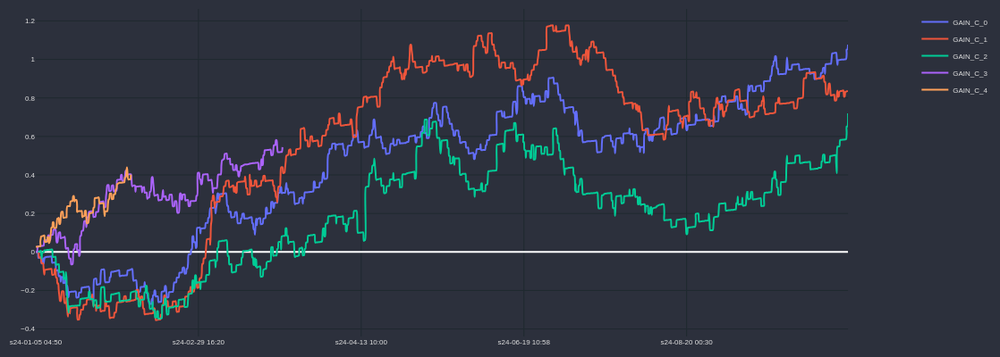

In [523]:

rank = rank_AVAX

temp_df = rank.iloc[0].r.copy()
first_p = rank.iloc[0].first_p
last_p = rank.iloc[0].last_p
rel_first_last = (last_p - first_p)/last_p
print(rank.iloc[0].pair, first_p, last_p, rel_first_last )

temp_df['time'] = temp_df['end_time']

line_traces = []
for i in range(5):
    temp_df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
    line_traces.append(f'GAIN_C_{i}')

cp = CandlePlot(temp_df, candles=False)
cp.show_plot(line_traces=line_traces)

In [524]:
df_test.describe()

,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,operacoes_simultaneas
count,12089.000000,12089.000000,12089.0,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089.000000,12089,12089,12089.000000
mean,194934.924229,338.146000,0.0,0.001448,0.001771,1.612044,0.891223,-0.035109,0.042018,0.001910,20.041713,20.035968,0.530069,0.469931,0.029938,2024-05-19 10:10:04.213748224,2024-05-19 04:32:55.453718272,14.237406
min,424.000000,1.000000,0.0,-0.066846,-0.066046,1.000000,0.000000,-0.040000,0.010000,-0.040000,0.076800,0.077100,0.000000,0.000000,-4.410000,2024-01-05 03:05:00,2024-01-05 02:42:00,1.000000
25%,98122.000000,39.000000,0.0,0.000200,0.000135,1.000000,1.000000,-0.040000,0.030000,0.001000,0.448600,0.449200,0.000000,0.000000,0.000050,2024-03-13 05:28:00,2024-03-12 23:00:00,8.000000
50%,168683.000000,102.000000,0.0,0.000200,0.000925,1.000000,1.000000,-0.040000,0.040000,0.001000,6.465000,6.476000,1.000000,0.000000,0.000900,2024-05-01 08:20:00,2024-04-30 23:01:00,13.000000
75%,302456.000000,294.000000,0.0,0.000929,0.001729,2.000000,1.000000,-0.030000,0.040000,0.001000,34.850000,34.840000,1.000000,1.000000,0.030000,2024-08-02 02:27:00,2024-08-01 20:34:00,18.000000
max,433491.000000,43690.000000,0.0,0.274386,0.274359,9.000000,1.000000,-0.010000,0.640000,0.275186,110.290000,110.240000,1.000000,1.000000,12.610000,2024-10-31 23:49:00,2024-10-31 20:29:00,60.000000
std,119622.948031,1282.797054,0.0,0.019969,0.019673,0.880730,0.311372,0.005775,0.028361,0.019805,24.427725,24.415944,0.499116,0.499116,0.620392,NaN,NaN,8.250577


In [525]:
df_test.head()


,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,operacoes_simultaneas
0,False,424,388,0,0.000200,-0.000360,2,False,1,-0.04,0.04,0.001,buy,0.5555,0.5553,1,0,-0.0002,2024-01-05 09:09:00,2024-01-05 02:42:00,2
1,False,424,388,0,0.000200,-0.000360,2,False,1,-0.04,0.04,0.001,buy,0.5555,0.5553,1,0,-0.0002,2024-01-05 09:09:00,2024-01-05 02:42:00,2
2,False,429,383,0,0.000461,0.001261,1,False,1,-0.03,0.03,0.001,buy,0.5546,0.5553,1,0,0.0007,2024-01-05 09:09:00,2024-01-05 02:47:00,4
3,False,429,383,0,0.000461,0.001261,1,False,1,-0.04,0.04,0.001,buy,0.5546,0.5553,1,0,0.0007,2024-01-05 09:09:00,2024-01-05 02:47:00,4
4,False,432,16,0,0.000200,-0.000181,1,False,1,-0.03,0.03,0.001,buy,0.5537,0.5536,1,0,-0.0001,2024-01-05 03:05:00,2024-01-05 02:50:00,5


In [526]:
df_test = df_test.sort_values(by='end_time', ascending=True).reset_index(drop=True)
df_test.head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,operacoes_simultaneas
0,False,432,16,0,0.000200,-0.000181,1,False,1,-0.03,0.03,0.001,buy,0.5537,0.5536,1,0,-0.0001,2024-01-05 03:05:00,2024-01-05 02:50:00,5
1,False,537,16,0,0.000826,0.001626,2,False,1,-0.03,0.03,0.001,buy,36.8600,36.9200,1,0,0.0600,2024-01-05 04:50:00,2024-01-05 04:35:00,25
2,False,537,16,0,0.000826,0.001626,2,False,1,-0.04,0.04,0.001,buy,36.8600,36.9200,1,0,0.0600,2024-01-05 04:50:00,2024-01-05 04:35:00,25
3,False,537,16,0,0.000826,0.001626,2,False,1,-0.03,0.03,0.001,buy,36.8600,36.9200,1,0,0.0600,2024-01-05 04:50:00,2024-01-05 04:35:00,25
4,False,533,25,0,0.000288,0.001088,3,False,1,-0.03,0.03,0.001,buy,36.7400,36.7800,1,0,0.0400,2024-01-05 04:55:00,2024-01-05 04:31:00,21


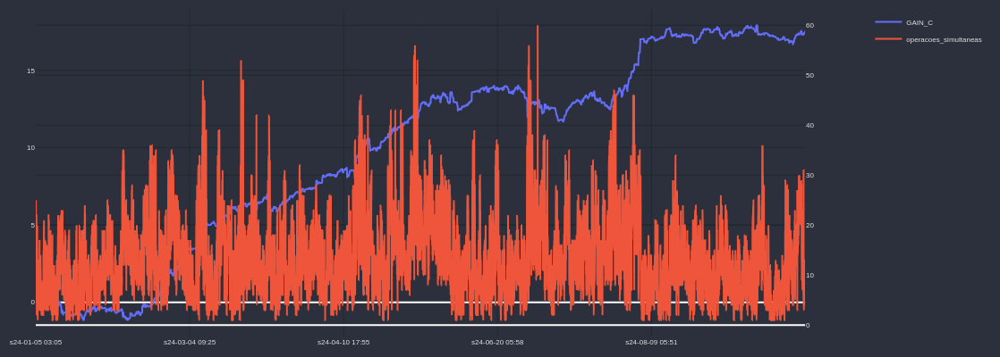

In [527]:

df_test['time'] = df_test['end_time']
df_test['GAIN_C'] = df_test.strategy.cumsum()

cp = CandlePlot(df_test, candles=False)
cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['operacoes_simultaneas'])

In [528]:
df_test.strategy.sum()

np.float64(17.500853861206053)

In [529]:
df_test.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'stop_loss_percent', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'operacoes_simultaneas', 'time',
       'GAIN_C'],
      dtype='object')

In [530]:
df_test.shape

(12089, 23)

In [531]:
df_test[df_test['operacoes_simultaneas']>1].shape

(11997, 23)

In [532]:

def remove_simultaneous_operations(df, max_simultaneous_operations=1):
    # Ordena o DataFrame pelo `start_time`
    df = df.sort_values(by='start_time').reset_index(drop=True)
    
    # Lista para armazenar as operações filtradas
    filtered_operations = []
    
    # Lista para manter o `end_time` das operações aceitas atualmente
    active_end_times = []
    
    for _, row in df.iterrows():
        # Remove as operações ativas que já terminaram antes do `start_time` atual
        active_end_times = [end_time for end_time in active_end_times if end_time > row['start_time']]
        
        # Verifica se o número de operações ativas é menor que o máximo permitido
        if len(active_end_times) < max_simultaneous_operations:
            # Adiciona a operação à lista de filtradas
            filtered_operations.append(row)
            # Adiciona o `end_time` da operação atual à lista de operações ativas
            active_end_times.append(row['end_time'])
    
    # Retorna um novo DataFrame com as operações filtradas
    return pd.DataFrame(filtered_operations)

# Exemplo de uso
# Suponha que df seja o seu DataFrame com colunas 'start_time' e 'end_time'
# df_filtered = remove_simultaneous_operations(df_test, max_simultaneous_operations=1)
df_filtered = df_test.copy()

In [533]:
df_filtered.shape

(12089, 23)

In [534]:
df_filtered.head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,operacoes_simultaneas,time,GAIN_C
0,False,432,16,0,0.000200,-0.000181,1,False,1,-0.03,0.03,0.001,buy,0.5537,0.5536,1,0,-0.0001,2024-01-05 03:05:00,2024-01-05 02:50:00,5,2024-01-05 03:05:00,0.000200
1,False,537,16,0,0.000826,0.001626,2,False,1,-0.03,0.03,0.001,buy,36.8600,36.9200,1,0,0.0600,2024-01-05 04:50:00,2024-01-05 04:35:00,25,2024-01-05 04:50:00,0.001026
2,False,537,16,0,0.000826,0.001626,2,False,1,-0.04,0.04,0.001,buy,36.8600,36.9200,1,0,0.0600,2024-01-05 04:50:00,2024-01-05 04:35:00,25,2024-01-05 04:50:00,0.001853
3,False,537,16,0,0.000826,0.001626,2,False,1,-0.03,0.03,0.001,buy,36.8600,36.9200,1,0,0.0600,2024-01-05 04:50:00,2024-01-05 04:35:00,25,2024-01-05 04:50:00,0.002679
4,False,533,25,0,0.000288,0.001088,3,False,1,-0.03,0.03,0.001,buy,36.7400,36.7800,1,0,0.0400,2024-01-05 04:55:00,2024-01-05 04:31:00,21,2024-01-05 04:55:00,0.002968


In [535]:
# df_filtered = calcular_operacoes_simultaneas(df_filtered)


In [536]:
df_filtered.operacoes_simultaneas.max(), df_filtered.operacoes_simultaneas.mean()

(np.int64(60), np.float64(14.237405906195715))

In [537]:
df_filtered.strategy.sum()

np.float64(17.500853861206053)

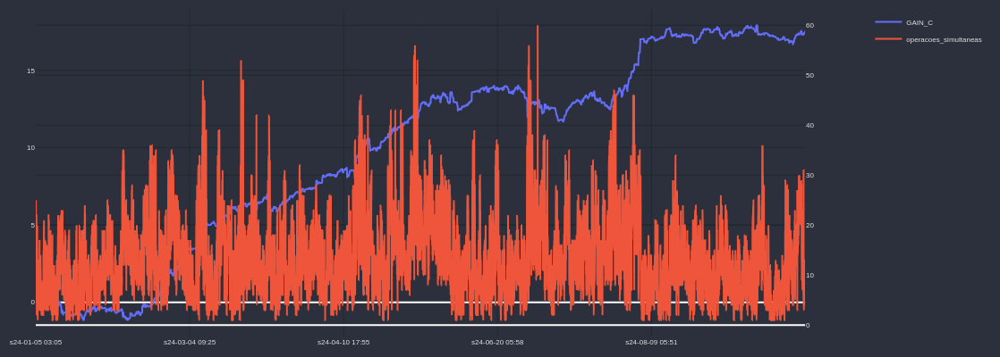

In [538]:

df_filtered['time'] = df_filtered['end_time']
df_filtered['GAIN_C'] = df_filtered.strategy.cumsum()

cp = CandlePlot(df_filtered, candles=False)
cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['operacoes_simultaneas'])

In [539]:
df_filtered.strategy.sum()

np.float64(17.500853861206053)

In [540]:
pos = df_filtered[df_filtered['strategy']>0]
neg = df_filtered[df_filtered['strategy']<0]

print(len(pos),len(neg), len(pos)/(len(pos)+len(neg)))

10774 1315 0.8912234262552734


In [541]:
df_filtered.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'stop_loss_percent', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'operacoes_simultaneas', 'time',
       'GAIN_C'],
      dtype='object')

In [542]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 

def add_sessions(df, visualize=False):
    """
    Adapta o método add_sessions para o DataFrame fornecido.
    Adiciona uma coluna de sessão para agrupar operações consecutivas e calcula o retorno composto da sessão.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo operações de trading.
        visualize (bool): Se True, plota o retorno composto das sessões ao longo do tempo.

    Retorna:
        pd.DataFrame: DataFrame com colunas de sessão e retorno composto da sessão.
    """
    # Cria um identificador de sessão com base no trigger_type ou nos sinais de compra/venda
    df["session"] = np.sign(df["SIGNAL_UP"] - df["SIGNAL_DOWN"]).cumsum().shift().fillna(0)
    
    # Retorno composto da sessão com base na coluna strategy
    df["session_compound"] = df.groupby("session")["strategy"].cumsum().apply(np.exp) - 1
    
    # Visualização opcional do retorno composto por sessão
    if visualize:
        df["session_compound"].plot(figsize=(12, 8))
        plt.show()
    
    return df

In [543]:
# df_filtered = add_sessions(df_filtered, True)

In [544]:


import numpy as np
import pandas as pd

def add_leverage(df, leverage, valor_inicial, use_sessions=True, reinvestir_percentual=100, report=True):
    """
    Aplica alavancagem à estratégia com opção de usar sessões de trading e reinvestir apenas uma porcentagem do lucro.
    Adiciona colunas para o valor retido a cada operação e o valor acumulado retido.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo operações de trading.
        leverage (float): Grau de alavancagem a ser aplicado.
        valor_inicial (float): Valor inicial investido em dólares.
        use_sessions (bool): Se True, aplica o add_sessions para ajustar a alavancagem dinamicamente por sessão.
        reinvestir_percentual (float): Percentual do lucro acumulado a reinvestir (0 a 100).
        report (bool): Se True, imprime um relatório de desempenho com a alavancagem aplicada.

    Retorna:
        pd.DataFrame: DataFrame com as colunas de retorno alavancado, retorno real, valor retido e valor retido acumulado.
    """
    # Aplica `add_sessions` para calcular o retorno composto da sessão, se necessário
    if use_sessions:
        df = add_sessions(df)
    
    # Calcula o retorno simples da estratégia
    df["simple_ret"] = np.exp(df["strategy"]) - 1
    
    # Calcula a alavancagem efetiva (eff_lev) com base nas sessões e sinais de trading
    if use_sessions:
        # Calcula alavancagem com ajuste dinâmico por sessão
        df["eff_lev"] = leverage * (1 + df["session_compound"]) / (1 + leverage * df["session_compound"])
        df["eff_lev"] = df["eff_lev"].fillna(leverage)  # Preenche valores nulos com alavancagem padrão
    else:
        # Alavancagem constante quando não se usa sessões
        df["eff_lev"] = leverage
    
    # Aplica a alavancagem direta nas operações de compra e venda
    # Para compras (SIGNAL_UP = 1) e vendas (SIGNAL_DOWN = -1)
    df.loc[df["SIGNAL_UP"] == 1, "eff_lev"] = leverage
    df.loc[df["SIGNAL_DOWN"] == -1, "eff_lev"] = leverage

    # Configuração para reinvestimento parcial e inicialização de variáveis
    reinvest_factor = reinvestir_percentual / 100
    capital_reinvestido, valor_retenido_total = valor_inicial, 0.0

    # Loop para calcular retornos alavancados e valores retidos
    for i in range(len(df)):
        # Retorno alavancado para a operação atual
        levered_return = max(df["eff_lev"].iloc[i] * df["simple_ret"].iloc[i], -1)
        df.at[i, "retorno_real"] = capital_reinvestido * (1 + reinvest_factor * levered_return)
        
        # Calcula o valor retido (parte do lucro que não é reinvestida)
        valor_retenido = (1 - reinvest_factor) * capital_reinvestido * levered_return
        valor_retenido_total += valor_retenido

        # Atualiza DataFrame com valores retidos e acumulados
        df.at[i, "valor_retenido"] = valor_retenido
        df.at[i, "valor_retenido_acumulado"] = valor_retenido_total
        df.at[i, "strategy_levered"] = levered_return

        # Atualiza o capital reinvestido para a próxima operação
        capital_reinvestido = df.at[i, "retorno_real"]

    # Calcula o retorno de cada operação (sem acumulação)
    df["retorno_operacao"] = df["retorno_real"].diff().fillna(df["retorno_real"])
    
    # Calcula o valor retido específico de cada operação (sem acumulação), baseado no retorno da operação
    df["valor_retenido_operacao"] = df["retorno_operacao"] * (1 - reinvestir_percentual / 100)

    
    # Retorno composto acumulado da estratégia
    df["cstrategy_levered"] = (df["strategy_levered"] + 1).cumprod()

    # Relatório final, se necessário
    if report:
        print("Desempenho com Alavancagem e Reinvestimento Parcial:")
        print(f"Retorno final alavancado: {df['cstrategy_levered'].iloc[-1] - 1:.2%}")
        print(f"Valor final do investimento com reinvestimento de {reinvestir_percentual}%: ${df['retorno_real'].iloc[-1]:,.2f}")
        print(f"Valor total retido: ${valor_retenido_total:,.2f}")
    
    return df



In [545]:
# df_filtered = add_leverage(df_filtered,
#                            leverage=1, 
#                            valor_inicial=20, 
#                            use_sessions=True, 
#                            reinvestir_percentual=100, 
#                            report=True)

In [546]:
# cp = CandlePlot(df_filtered, candles=False)
# cp.show_plot(line_traces = ['strategy_levered'], sec_traces=['cstrategy_levered'])

In [547]:
# cp = CandlePlot(df_filtered, candles=False)
# cp.show_plot(line_traces = ['retorno_real','valor_retenido_acumulado'])

In [548]:
# cp = CandlePlot(df_filtered, candles=False)
# cp.show_plot(line_traces = ['retorno_operacao','valor_retenido_operacao'])

In [549]:
import numpy as np
import pandas as pd

def calcular_retorno_dinamico_com_alavancagem(df, saldo_total, alavancagem=1, percentual_capital=10):
    """
    Calcula o retorno acumulado em dólar com controle de reserva, considerando operações simultâneas e mantendo
    o saldo total inalterado até que as operações sejam fechadas.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo as colunas `start_time`, `end_time`, e `strategy`.
        saldo_total (float): Saldo total inicial disponível para operações.
        alavancagem (float): Fator de alavancagem a ser aplicado nas operações.
        percentual_capital (float): Percentual do saldo total a ser usado em cada operação.

    Retorno:
        pd.DataFrame: DataFrame atualizado com colunas adicionais e métricas.
    """
    # Ordenar o DataFrame pelo tempo de abertura
    df = df.sort_values(by="start_time").reset_index(drop=True)

    # Inicializar arrays e variáveis
    n = len(df)
    capital_usado = saldo_total / percentual_capital

    status = np.full(n, "fechada", dtype=object)
    retorno_dolar = np.zeros(n)
    capital_acumulado = np.full(n, saldo_total)
    saldo_total_arr = np.full(n, saldo_total)
    capital_usado_arr = np.zeros(n)

    for i in range(n):
        # Fechar operações cujo end_time já passou
        abertas = (status == "aberta") & (df["end_time"].values <= df["start_time"].iloc[i])
        for j in np.where(abertas)[0]:
            retorno_alavancado = alavancagem * (df["strategy"].iloc[j] * capital_usado_arr[j])
            saldo_total += retorno_alavancado  # Atualizar saldo total com o retorno da operação
            retorno_dolar[j] = retorno_alavancado
            status[j] = "fechada"
            # Recalcular o capital usado após fechar uma operação
            capital_usado = saldo_total / percentual_capital

        capital_usado_arr[i] = capital_usado

        # Marcar a operação como aberta
        status[i] = "aberta"

        # Atualizar o saldo acumulado e saldo total
        saldo_total_arr[i] = saldo_total
        capital_acumulado[i] = saldo_total

    # Adicionar os resultados ao DataFrame
    df["capital_usado"] = capital_usado_arr
    df["retorno_dolar"] = retorno_dolar
    df["capital_acumulado"] = capital_acumulado
    df["saldo_total"] = saldo_total_arr
    df["status"] = status

    print("Resumo Final:")
    print(f"Saldo total final: ${saldo_total:.2f}")
    return df


In [550]:
df_filtered.operacoes_simultaneas.mean()

np.float64(14.237405906195715)

In [565]:
# valor_inicial = 5.0
saldo_total = 1000.0

# Exemplo de uso com alavancagem
df_resultado_dinamico_alavancagem = calcular_retorno_dinamico_com_alavancagem(
    df_filtered, saldo_total, alavancagem=30, percentual_capital=50
)

Resumo Final:
Saldo total final: $122685.69


In [566]:
df_filtered.strategy.sum()

np.float64(17.500853861206053)

In [567]:
df_resultado_dinamico_alavancagem[["start_time", "end_time", "strategy", "capital_usado", "retorno_dolar",
              "capital_acumulado", "saldo_total"]].head(2500)

,start_time,end_time,strategy,capital_usado,retorno_dolar,capital_acumulado,saldo_total
0,2024-01-05 02:42:00,2024-01-05 09:09:00,0.000200,20.000000,0.120000,1000.000000,1000.000000
1,2024-01-05 02:42:00,2024-01-05 09:09:00,0.000200,20.000000,0.120000,1000.000000,1000.000000
2,2024-01-05 02:47:00,2024-01-05 09:09:00,0.000461,20.000000,0.276825,1000.000000,1000.000000
3,2024-01-05 02:47:00,2024-01-05 09:09:00,0.000461,20.000000,0.276825,1000.000000,1000.000000
4,2024-01-05 02:50:00,2024-01-05 03:05:00,0.000200,20.000000,0.120000,1000.000000,1000.000000
5,2024-01-05 03:04:00,2024-01-05 09:09:00,0.000200,20.000000,0.120000,1000.000000,1000.000000
6,2024-01-05 03:04:00,2024-01-05 09:09:00,0.000200,20.000000,0.120000,1000.000000,1000.000000
7,2024-01-05 03:10:00,2024-01-05 05:53:00,0.000200,20.002400,0.120014,1000.120000,1000.120000
8,2024-01-05 03:12:00,2024-01-05 09:16:00,0.000200,20.002400,0.120014,1000.120000,1000.120000
9,2024-01-05 03:15:00,2024-01-05 09:17:00,0.000200,20.002400,0.120014,1000.120000,1000.120000


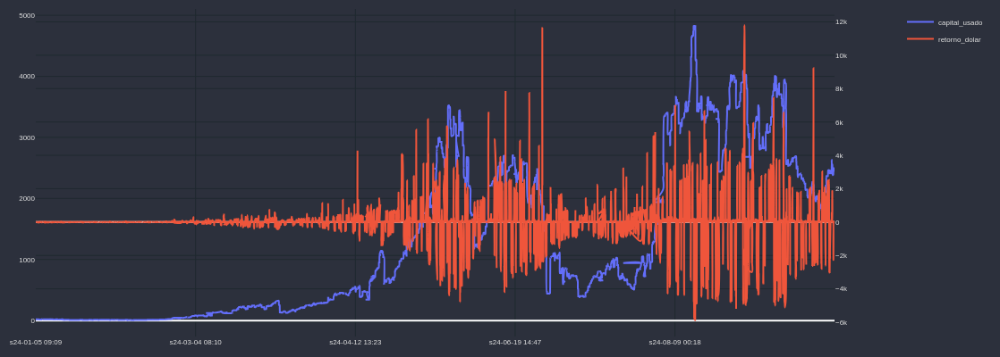

In [568]:
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_usado'], sec_traces=['retorno_dolar'])

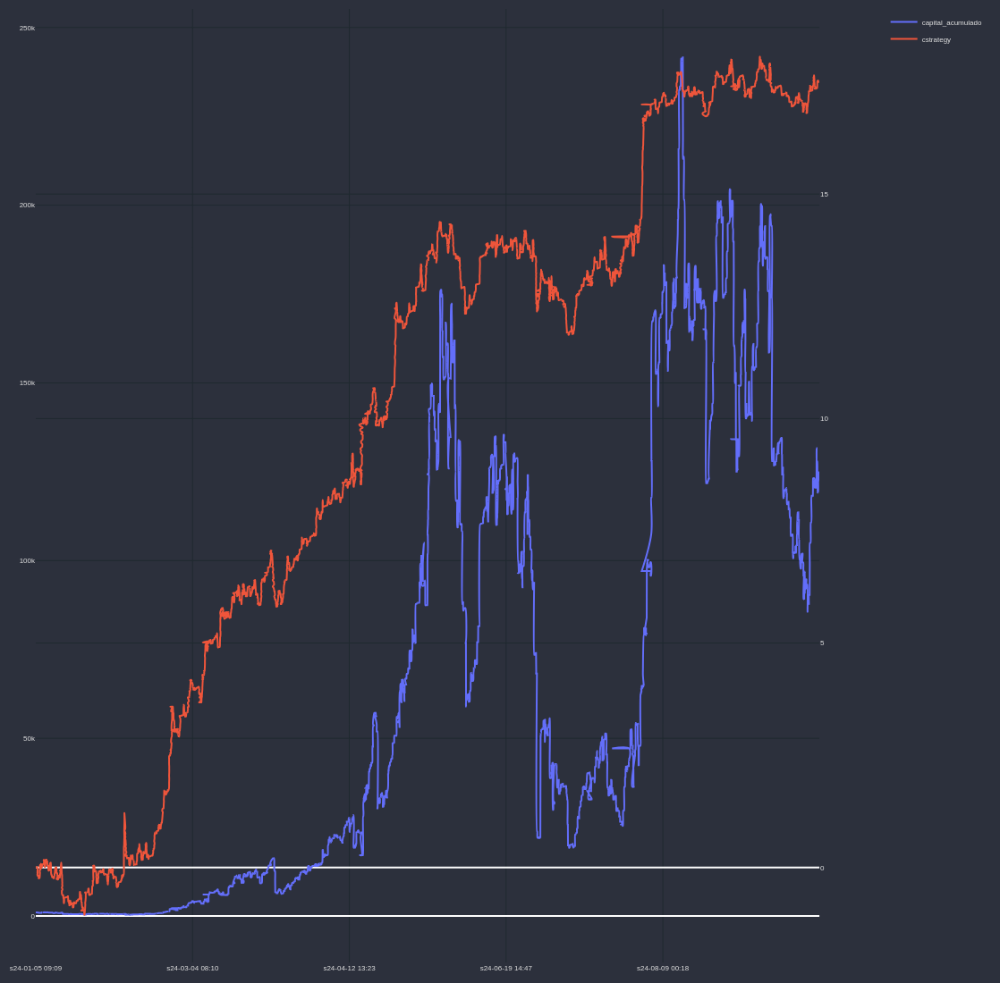

In [569]:
df_resultado_dinamico_alavancagem['cstrategy'] = df_resultado_dinamico_alavancagem.strategy.cumsum()
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_acumulado'], sec_traces=['cstrategy'], height=1100)